<h1>Решение задачи бинарной классификации изображений на примере датасета Chest X-Ray Images</h1>

<h1>Оглавление</h1><a name="index"></a>

[Описание проекта](#000)
  * [Датасет](#010)
  * [Модель](#020)

[1. Загрузка и изучение данных](#100)<br>
[2. Анализ данных](#200)<br>
[3. Исследование моделей](#300)
* [3.1 Базовая модель](#310)
  * [3.1.1 Подготовка данных](#311)
  * [3.1.2 Сборка модели](#312)
  * [3.1.3 Обучение модели](#313)
* [3.2 Баланс классов](#320)
* [3.3 Разморозка слоев](#330)
* [3.4 Аугментация: поворот изображений](#340)
* [3.5 Размерность слоя Dense()](#350)
* [3.6 Подбор оптимальной скорости обучения](#360)
* [3.7 Количество слоев Dense()](#370)
* [3.8 Количество эпох обучения](#380)
* [3.9 Метод интерполяции изображений](#390)
* [3.10 Анализ результата](#301)

[4. Построение тепловой карты активации класса](#400)<br>
[5. Общий вывод](#500)

## Описание проекта<a name="000"></a>
Данный pet-проект выполняется с целью закрепления и углубления знаний по теме компьютерного зрения.

Вычисления осуществляются в бесплатной версии Google Colab (в среде GPU), что накладывает некоторые ограничения на объем входных данных и сложность исследуемой модели:
* Выбор **датасета** должен быть основан на его открытости и общедоступности. Датасет должен отражать реальную задачу.
* Выбор **модели** следует остановить на компактной и не слишком сложной. Способной качественно решить задачу. Желательно интегрированной во фреймворк Keras.

### Датасет<a name="010"></a>

В качестве датасета выбран **Chest X-Ray Images (Pneumonia)**:
* [Датасет на kaggle.com](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia)
* [Identifying Medical Diagnoses and Treatable Diseases by Image-Based Deep Learning](https://www.cell.com/cell/fulltext/S0092-8674(18)30154-5)

**Перевод описания датасета**:<br>
<blockquote><i>Датасет представлен в виде 3 папок: <code>train</code>, <code>test</code> и <code>val</code>. В каждой из них есть подпапки для категорий изображений (<code>Pneumonia</code> / <code>Normal</code>).
Всего в датасете — 5856 рентгеновских снимка (в формате JPEG), относящихся к двум категориям: пневмония и норма.<br><br>Рентгенограммы грудной клетки (передне-задние проекции) были взяты из ретроспективных данных педиатрических пациентов в возрасте от 1 до 5 лет, набранных в женском и детском медицинском центре (Гуанчжоу). Все рентгеновские снимки были выполнены в рамках стандартного клинического обследования пациентов.<br><br>При анализе рентгенограмм грудной клетки все изображения сначала прошли предварительный контроль качества — были удалены изображения низкого качества или с трудночитаемые. После этого диагнозы, соответствующие изображениям, были проверены и классифицированы двумя опытными врачами перед использованием в обучении ИИ-системы.<br><br>Чтобы учесть возможные ошибки при разметке, тестовый набор также был перепроверен третьим экспертом.</i></blockquote>

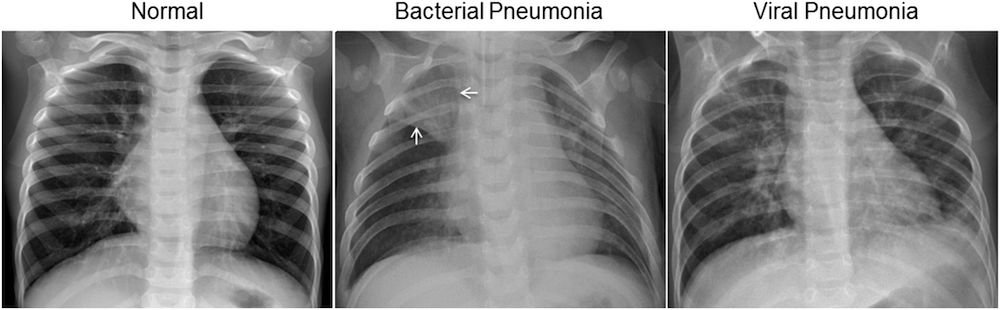

<blockquote><i><li>Нормальная рентгенограмма грудной клетки (левое изображение) показывает чистые лёгкие без участков патологического затемнения.<li>При бактериальной пневмонии (в центре) обычно наблюдается очаговая долевая консолидация — в данном случае в верхней доле правого лёгкого (указано белыми стрелками).<li>Вирусная пневмония (справа) проявляется более диффузным «интерстициальным» рисунком, затрагивающим оба лёгких.</i></blockquote>

Это относительно небольшой датасет (5856 изображения) для бинарной классификации, в то же время, он отражает вполне реальную медицинскую задачу -- выявление пневмонии по рентгеновскому снимку легких. Полученные в ходе исследования результаты могут быть использованы для решения ряда подобных задач.

[Вернуться к оглавлению](#index)

### Модель<a name="020"></a>

В качестве модели для исследования я выбрал **MobileNetV2**:
* Это довольно компактная и легковесная модель.
* Подходит для маломощных устройств.
* Количество параметров модели: \~2.3 млн, что меньше, чем у аналогов, например ResNet50 (~25.6 млн.), но достаточно для решения реальной задачи.
* Хорошо подходит для классификации медицинских изображений при дообучении.

Хотя на данный момент уже существует MobileNetV4, выбор в пользу V2 основан:
* Сложность V2 ниже чем у V4
* V2 входит в состав фреймворка `tf.keras.applications` - можно легко применять в Google Colab
* Довольно простая интерпретируемость V2, в частности для Grad-CAM.

**Основная цель проекта**: закрепление и углубление знаний по теме компьютерного зрения.

**Основные задачи проекта**:
1. Закрепить навыки работы с нейросетями для решения задачи классификации изображений.
2. Оценить возможности модели MobileNetV2 для решения рассматриваемой задачи.
3. Выявить факторы оказывающие влияние на повышение точности модели.
4. Научиться применять Grad-CAM для визуализации тепловых карт активации класса модели.

[Вернуться к оглавлению](#index)

## 1. Загрузка и изучение данных<a name="100"></a>
Импорт необходимых для выполнения проекта библиотек:

In [1]:
# Python 3.11.13
import pandas as pd # 2.2.2
import numpy as np # 2.0.2
import matplotlib.pyplot as plt # 3.10.0
from PIL import Image, ImageChops, ImageEnhance # 11.2.1

import tensorflow as tf # 2.18.0 # keras==3.8.0
from sklearn.utils.class_weight import compute_class_weight # 1.6.1
import networkx as nx # 3.5
import plotly.graph_objects as go # 5.24.1

import os
import shutil
import random
import pickle
import warnings
warnings.filterwarnings('ignore')

Установка вспомогательных настроек, функций и констант:

In [2]:
#@markdown

# настройка отображения графиков по умолчанию:
#plt.rcParams["figure.figsize"] = (13,5) # размер графиков
plt.rcParams.update({'axes.grid' : True, 'grid.alpha': 0.33, 'grid.linestyle': '--'}) # отображение сетки

# переменные для форматирования шрифта при выводе информации:
green, red, bold, end = '\33[92m', '\33[91m', '\33[1m', '\33[0m'

# создание переменной псевдослучайности
RANDOM_STATE = 42

def dir_tree(base_path, dir_del=False, cleanup=False):
    """Функция для отображения структуры директории.
    С опцией удаления нежелательных папок"""

    # удаление ненужных корневых папок
    if dir_del:
        for dir in dir_del:
            if os.path.exists(dir):
                shutil.rmtree(dir)

    # подсчет файлов и вывод структуры каталога:
    total_files = 0
    ext_list = []

    for root, dirs, files in os.walk(base_path):
        total_files += len(files)
        level = root.replace(base_path, '').count(os.sep)
        indent = ' ' * 4 * level
        print(f"{indent}- {os.path.basename(root)}/ ({len(files)})")
        for file in files:
            name, ext = os.path.splitext(file)
            if ext not in ext_list:
                ext_list.append(ext)

    print('\nВсего файлов:', total_files)
    print('Расширения файлов:', ext_list)
    return total_files

def draw_pie(data, labels, title):
    """Функция для отрисовки круговой диаграммы для распределения признака
    для трех наборов данных: train / val / test"""
    fig, axes = plt.subplots(1, 3, figsize=(10, 4))
    titles = ['train', 'val', 'test']
    for i, (ax, values) in enumerate(zip(axes, data)):
        ax.pie(values, labels=labels, autopct='%1.1f%%')
        ax.set_title(titles[i])
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def sizes_stat(base_path, size_min=(224, 224)):
    """Функция для подсчета размеров файлов: ширина, высота, разрешение"""

    (w_min, h_min) = size_min
    image_sizes = {
        'file':[],
        'width':[],
        'height':[],
        'mega_pix':[]
        }

    for dir in os.listdir(base_path):
        for subdir in os.listdir(os.path.join(base_path, dir)):
            path = os.path.join(base_path, dir, subdir)
            for file in os.listdir(path):
                img = Image.open(os.path.join(path, file))
                width, height = img.size
                image_sizes['file'].append(f"{dir}/{subdir}/{file}")
                image_sizes['width'].append(width)
                image_sizes['height'].append(height)
                image_sizes['mega_pix'].append(width * height)

    fig, axes = plt.subplots(1, 2, figsize=(13, 5))

    # hexbin
    hb = axes[0].hexbin(image_sizes['width'], image_sizes['height'], gridsize=50, cmap='hot_r')
    axes[0].set_title("Плотности значений размеров изображений")
    axes[0].set_xlabel("Ширина (width)")
    axes[0].set_ylabel("Высота (height)")
    fig.colorbar(hb, ax=axes[0], label='Количество изображений', shrink=1.0, pad=0.01)

    # Гистограмма
    axes[1].hist(image_sizes['mega_pix'], bins=100)
    axes[1].set_title("Гистограмма распределения разрешения изображений")
    axes[1].set_xlabel('Распределение по мегапикселям')
    axes[1].set_ylabel('Частота')

    plt.tight_layout()
    plt.show()

    print()

    # вывод описательной информации:
    thresholds = {
        'width': w_min,
        'height': h_min,
        'mega_pix': w_min*h_min
    }

    display(
        pd.concat([
            pd.DataFrame(image_sizes).describe(),
            pd.DataFrame([{col: thresh for col, thresh in thresholds.items()}], index=['thold']),
            pd.DataFrame([{col: (pd.DataFrame(image_sizes)[col] < thresh).sum() for col, thresh in thresholds.items()}], index=['x < thold'])
            ]).T.style.format('{:.1f}').set_caption('Описательная информация:')
        )
    return image_sizes

def show_img(image_files):
    """Функция для отображения 9 произвольных файлов из заданного списка"""

    # Устанавливаем seed для воспроизводимости
    random.seed(RANDOM_STATE)

    # Выбираем 3 случайных изображения
    selected_images = random.sample(image_files, 9)

    # Открываем изображения
    images = [Image.open(os.path.join(base_path, 'train', img)) for img in selected_images]

    # Выводим изображения в ряд
    fig, axes = plt.subplots(3, 3, figsize=(11, 11))

    for i, (ax, img, path) in enumerate(zip(axes.flat, images, selected_images)):
        ax.imshow(img, cmap='gray')
        ax.set_title(os.path.basename(path))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

def compute_pixel_normalized_histogram(folder_path):
    """Функция для расчета усредненной яркости пикселей (от 0/черный до 255/белый).
    Расчет ведется с учетом:
    * в классах разное количество изображений
    * каждое изображение может иметь разный размер"""

    histogram = np.zeros(256, dtype=np.int64)
    total_pixels = 0

    for filename in os.listdir(folder_path):
        if filename.endswith(('.jpg', '.png', '.jpeg', '.bmp')):
            img_path = os.path.join(folder_path, filename)
            with Image.open(img_path) as img:
                img_gray = img.convert('L')  # Преобразуем в grayscale
                arr = np.array(img_gray).ravel()  # Превращаем в одномерный массив
                histogram += np.bincount(arr, minlength=256)
                total_pixels += len(arr)

    if total_pixels == 0:
        raise ValueError(f"В папке {folder_path} не найдено подходящих изображений.")

    # Нормируем по общему числу пикселей
    normalized_histogram = histogram / total_pixels
    return normalized_histogram

def draw_pixel_hist(hist1, hist2):
    """Функция для отрисовки графиков усредненной яркости пикселей
    для двух наборов данных"""

    # Строим точечный график
    x_values = range(256)

    plt.plot(x_values, hist1, 'o-', label='PNEUMONIA', markersize=3, linewidth=1)
    plt.plot(x_values, hist2, 'o-', label='NORMAL', markersize=3, linewidth=1)

    plt.xlabel('Яркость пикселя (0-255)')
    plt.ylabel('Среднее количество пикселей')
    plt.title('Усреднённая яркость пикселей по двум папкам')
    plt.legend()
    plt.ylim(top=0.015)
    plt.tight_layout()
    plt.show()

def plot_training_history(history):
    """Функция для отрисовки зафиксированных
    во время процесса обучения метрик модели
    {AUC, F1, Precision, Recall, Accuracy, loss}"""

    # Добавляем F1 как среднее гармоническое Precision и Recall (если его нет)
    if 'F1' not in history:
        if 'Precision' in history and 'Recall' in history:
            f1_scores = []
            for p, r in zip(history['Precision'], history['Recall']):
                f1 = 2 * p * r / (p + r + 1e-8) if (p + r) > 0 else 0
                f1_scores.append(f1)
            history['F1'] = f1_scores

            # Для валидации
            if 'val_Precision' in history and 'val_Recall' in history:
                val_f1_scores = [
                    2 * p * r / (p + r + 1e-8) if (p + r) > 0 else 0
                    for p, r in zip(history['val_Precision'], history['val_Recall'])
                ]
                history['val_F1'] = val_f1_scores

    # Порядок графиков
    metrics_order = [
        ('AUC', 'AUC'),
        ('F1', 'F1 Score'),
        ('Precision', 'Precision'),
        ('Recall', 'Recall'),
        ('accuracy', 'Accuracy'),
        ('loss', 'Loss')
    ]

    # Создаем график 3 строки x 2 столбца
    fig, axes = plt.subplots(3, 2, figsize=(13, 15))
    axes = axes.flatten()

    plot_idx = 0
    for metric_key, title in metrics_order:
        if metric_key not in history:
            continue

        ax = axes[plot_idx]
        ax.plot(history[metric_key], label='train')

        val_metric = f"val_{metric_key}"
        if val_metric in history:
            ax.plot(history[val_metric], label='valid')

        ax.set_title(f'Метрика {title}')
        ax.set_xlabel('Эпоха')
        ax.set_ylabel(title)
        ax.legend()
        ax.grid(True)

        plot_idx += 1

    # Убираем лишние subplot'ы
    for j in range(plot_idx, 6):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

def models_compare(cfg_list, label_list=False, legend_title=None):
    """Функция для отрисовки графиков val_loss и val_AUC для указанного списка моделей"""
    epochs = 0

    # Определим максимальное число эпох
    for cgf in cfg_list:
        val_loss = result[cgf]['val_loss']
        if len(val_loss) > epochs:
            epochs = len(val_loss)

    # Создаем фигуру с двумя графиками в одном ряду
    fig, axes = plt.subplots(1, 2, figsize=(13, 5))  # Ширина может быть увеличена по желанию

    # Первый график: val_loss
    for i, cgf in enumerate(cfg_list):
        label = f"{cgf}: {label_list[i]}" if label_list else cgf
        val_loss = result[cgf]['val_loss']
        axes[0].plot(val_loss, label=label)

    axes[0].set_title("Распределение значений 'val_loss' по эпохам")
    axes[0].set_xlabel('Эпоха')
    axes[0].set_ylabel('val_loss')
    axes[0].set_xticks(range(epochs))
    axes[0].legend(title=legend_title)

    # Второй график: val_AUC
    for i, cgf in enumerate(cfg_list):
        label = f"{cgf}: {label_list[i]}" if label_list else cgf
        val_auc = result[cgf]['val_AUC']
        axes[1].plot(val_auc, label=label)

    axes[1].set_title("Распределение значений метрики 'val_AUC' по эпохам")
    axes[1].set_xlabel('Эпоха')
    axes[1].set_ylabel('val_AUC')
    axes[1].set_xticks(range(epochs))
    axes[1].legend(title=legend_title)

    plt.tight_layout()
    plt.show()

def metrics_compare(cfg_list, head=11):
    """Функция для вывода таблицы с метриками моделей на последней эпохе обучения
    для указанного списка"""
    df = pd.DataFrame(result).head(11)[
        cfg_list
        ].map(lambda x: x[-1] if isinstance(x, list) else x)

    df.columns = df.columns.str.replace('cfg_','')
    display(df.style.format('{:.3f}'))

def show_models_graph():
    """Функция для отрисовки графа исследуемых моделей"""
    # Создаем граф
    G = nx.Graph()

    color_1 = '#1c9c75'

    # Добавляем узлы с описаниями
    G.add_node('1.0', title="<b>base model</b><br>layers.Dense(128, activation='relu')<br>learning_rate=0.001")
    G.add_node('1.1', title="layers.Dense(128, activation='relu')<br>learning_rate=0.0001")
    G.add_node('1.2', title="layers.Dense(128, activation='relu')<br>learning_rate=0.00005")
    G.add_node('2.0', title="layers.Dense(128, activation='relu')<br>learning_rate=0.00005<br>class_weight")
    G.add_node('3.0', title="layers.Dense(128, activation='relu')<br>learning_rate=0.00005<br>class_weight<br>backbone.trainable=True")
    G.add_node('4.0', title="layers.Dense(128, activation='relu')<br>learning_rate=0.00005<br>class_weight<br>horizontal_flip=True")
    G.add_node('4.1', title="layers.Dense(128, activation='relu')<br>learning_rate=0.00005<br>class_weight<br>vertical_flip=True")
    G.add_node('4.2', title="layers.Dense(128, activation='relu')<br>learning_rate=0.00005<br>class_weight\
                            <br>horizontal_flip=True<br>vertical_flip=True")
    G.add_node('5.0', title="layers.Dense(256, activation='relu')<br>learning_rate=0.00005<br>class_weight<br>horizontal_flip=True")
    G.add_node('5.1', title="layers.Dense(64, activation='relu')<br>learning_rate=0.00005<br>class_weight<br>horizontal_flip=True")
    G.add_node('6.0', title="layers.Dense(256, activation='relu')<br>learning_rate=0.00001<br>class_weight<br>horizontal_flip=True")
    G.add_node('6.1', title="layers.Dense(256, activation='relu')<br>learning_rate=LRScheduler<br>class_weight<br>horizontal_flip=True")
    G.add_node('6.2', title="layers.Dense(256, activation='relu')<br>learning_rate=CosineDecay<br>class_weight<br>horizontal_flip=True")
    G.add_node('7.0', title="layers.Dense(256, activation='relu')<br>layers.Dense(128, activation='relu')<br>learning_rate=0.00005\
                            <br>class_weight<br>horizontal_flip=True")
    G.add_node('7.1', title="layers.Dense(128, activation='relu')<br>layers.Dense(64, activation='relu')<br>learning_rate=0.00005\
                            <br>class_weight<br>horizontal_flip=True")
    G.add_node('8.0', title="layers.Dense(256, activation='relu')<br>class_weight<br>horizontal_flip=True\
                            <br>learning_rate=0.00005 + EarlyStopping<br>epochs=20")
    G.add_node('8.1', title="layers.Dense(256, activation='relu')<br>class_weight<br>horizontal_flip=True\
                            <br>learning_rate=0.00001 + EarlyStopping<br>epochs=20")
    G.add_node('8.2', title="layers.Dense(256, activation='relu')<br>backbone.trainable=True<br>class_weight\
                            <br>horizontal_flip=True<br>learning_rate=0.00001 + EarlyStopping<br>epochs=20")
    G.add_node('8.3', title="layers.Dense(256, activation='relu')<br>backbone.trainable=True<br>class_weight\
                            <br>horizontal_flip=True<br>learning_rate=LearningRateScheduler<br>epochs=20")
    G.add_node('9.0', title="layers.Dense(256, activation='relu')<br>learning_rate=0.00005<br>class_weight\
                            <br>horizontal_flip=True<br>interpolation='bicubic'")
    G.add_node('9.1', title="layers.Dense(256, activation='relu')<br>learning_rate=0.0001<br>class_weight\
                            <br>horizontal_flip=True<br>interpolation='bicubic'")

    # Связи
    G.add_edge('1.0', '1.1', weight=1)
    G.add_edge('1.0', '1.2', weight=1, color=color_1)
    G.add_edge('1.2', '2.0', weight=1, color=color_1)
    G.add_edge('2.0', '3.0', weight=1)
    G.add_edge('2.0', '4.0', weight=0.5, color=color_1)
    G.add_edge('2.0', '4.1', weight=0.5)
    G.add_edge('2.0', '4.2', weight=0.5)
    G.add_edge('4.0', '5.0', weight=1, color=color_1)
    G.add_edge('4.0', '5.1', weight=1)
    G.add_edge('5.0', '6.0', weight=2)
    G.add_edge('5.0', '6.1', weight=2)
    G.add_edge('5.0', '6.2', weight=2)
    G.add_edge('5.0', '7.0', weight=0.5)
    G.add_edge('5.0', '7.1', weight=0.5)
    G.add_edge('5.0', '8.0', weight=0.25)
    G.add_edge('5.0', '8.1', weight=0.25)
    G.add_edge('5.0', '8.2', weight=0.25)
    G.add_edge('5.0', '8.3', weight=0.25)
    G.add_edge('5.0', '9.0', weight=0.17)
    G.add_edge('5.0', '9.1', weight=0.17)

    # Получаем позиции узлов
    pos = nx.spring_layout(G, weight='weight', seed=999) # SEED

    # Задаем координаты для отрисовки
    Xn = [pos[k][0] for k in pos]
    Yn = [pos[k][1] for k in pos]
    labels = list(pos.keys())
    hover_texts = [G.nodes[n].get('title', '') for n in pos]

    edge_colors = [edge[2]['color'] if 'color' in edge[2] else '#d9d9d9' for edge in G.edges(data=True)]

    # Рёбра
    edge_x = []
    edge_y = []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    # Отрисовка графа
    fig = go.Figure()

    # Рёбра
    for i, edge in enumerate(G.edges()):
        fig.add_trace(go.Scatter(
            x=[pos[edge[0]][0], pos[edge[1]][0], None],
            y=[pos[edge[0]][1], pos[edge[1]][1], None],
            mode='lines',
            line=dict(color=edge_colors[i], width=2),
            hoverinfo='none',
            showlegend=False
        ))

    fig.add_trace(go.Scatter(
        x=Xn, y=Yn,
        mode='markers+text',
        marker=dict(size=40, color=['#9ae497' if i == '1.0' else '#ffd966' if i == '5.0' else 'lightblue' for i in G.nodes]),
        text=labels,
        hovertemplate="%{customdata}<extra></extra>",
        customdata=hover_texts,
        textposition="middle center"
    ))

    fig.update_layout(
        showlegend=False,
        hovermode='closest',
        margin=dict(b=0, l=0, r=0, t=0),
        xaxis=dict(showgrid=False, zeroline=False, visible=False),
        yaxis=dict(showgrid=False, zeroline=False, visible=False),
        plot_bgcolor='white',
        width=950, height=600,
        title=dict(
            text="Граф исследуемых моделей",
            x=0.25,y=0.97,
            font=dict(size=20)
            )
        )

    fig.show()

def show_best_val_metric(result):
    """Функция для отрисовки метрик 'val_AUC', 'val_Precision', 'val_Recall', 'val_accuracy'
    на последней эпохе обучения"""
    models = sorted(result.keys())
    x = [i for i in models]

    plt.figure(figsize=(10, 4))
    for metric in ['val_AUC', 'val_Precision', 'val_Recall', 'val_accuracy']:
        y = [result[i][metric][-1] for i in models]
        plt.plot(x, y, 'o-', label=metric, lw=0.7, ms=4)

    plt.xticks(rotation=90)
    plt.title("Метрики исследуемых моделей на последней эпохе обучения")
    plt.xlabel("Наименование модели")
    plt.ylabel("Величина метрики")
    plt.legend()
    plt.show()

def image_check(img_path, model, target_size=(224, 224)):
    """Функция для тестовой проверки изображения:
    1. Рассчитывает вероятность принадлежности к целевому классу
    2.1 Отображает заданное изображение в исходном виде
    2.2 Строит тепловую карту слоя активации для заданного изображения
    2.3 Отображает оригинальное изображение с наложением тепловой карты"""

    # Загрузка изображения и преобразование в массив
    original_img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img_array = tf.keras.utils.img_to_array(original_img)
    img_array /= 255.0  # Нормализация
    img_array = np.expand_dims(img_array, axis=0)  # Добавляем batch dimension

    # Получение предсказания модели
    preds = model.predict(img_array, verbose=0)
    print(f"Прогнозируемая вероятность пневмонии: {100 * preds[0][0]:.2f}%")

    # Определение последнего сверточного слоя MobileNetV2
    last_conv_layer_name = "out_relu"  # Слой активации для MobileNetV2

    # Извлечение названий классификаторных слоёв
    classifier_layer_names = [
        layer.name for layer in model.layers
        if isinstance(layer, (tf.keras.layers.GlobalAveragePooling2D, tf.keras.layers.Dense))
    ]  # Ожидаемые слои: ["global_average_pooling2d", "dense", "dense_1"]

    # Получение базовой модели (MobileNetV2)
    backbone = model.get_layer('mobilenetv2_1.00_224')

    # Создание модели для последнего свёрточного слоя
    inputs = model.inputs
    backbone_output = backbone(inputs[0])  # Выход базовой модели
    last_conv_output = backbone.get_layer(last_conv_layer_name)(backbone_output)  # Выход последнего свёрточного слоя
    last_conv_layer_model = tf.keras.Model(inputs=inputs, outputs=last_conv_output)  # Модель для получения выхода свёрточного слоя

    # Создание модели классификатора
    classifier_input = tf.keras.Input(shape=last_conv_output.shape[1:])  # Входной тензор для классификатора
    x = classifier_input
    for layer_name in classifier_layer_names:
        layer = model.get_layer(layer_name)
        x = layer(x)  # Пропуск через классификаторные слои
    classifier_model = tf.keras.Model(classifier_input, x)  # Модель для вычисления классификации

    # Преобразование входного изображения в тензор
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)

    # Получение градиентов с помощью GradientTape
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)  # Наблюдаем за входным тензором
        last_conv_layer_output = last_conv_layer_model(img_tensor)  # Выход последнего свёрточного слоя
        tape.watch(last_conv_layer_output)  # Наблюдаем за выходом свёрточного слоя
        preds = classifier_model(last_conv_layer_output)  # Предсказание классификатора
        top_pred_index = 0  # Индекс класса "пневмония"
        top_class_channel = preds[:, top_pred_index]  # Выбор канала для пневмонии

    grads = tape.gradient(top_class_channel, last_conv_layer_output)  # Градиенты по отношению к выходу свёрточного слоя
    if grads is None:
        raise ValueError("Gradients are None, check model and layer configuration.")

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()  # Усреднение градиентов
    last_conv_layer_output = last_conv_layer_output.numpy()[0]  # Преобразование в NumPy-массив

    # Взвешивание карты признаков на основе градиентов
    for i in range(pooled_grads.shape[-1]):
        last_conv_layer_output[:, :, i] *= pooled_grads[i]

    heatmap = np.mean(last_conv_layer_output, axis=-1)  # Среднее значение по каналам
    heatmap = np.maximum(heatmap, 0)  # Отрицательные значения удаляются
    heatmap /= np.max(heatmap + 1e-10)  # Нормализация

    # Увеличение разрешения тепловой карты
    heatmap_tensor = tf.expand_dims(tf.expand_dims(heatmap, axis=-1), axis=0)
    heatmap_resized = tf.image.resize(heatmap_tensor, (224, 224), method='bicubic')
    heatmap_resized = tf.squeeze(heatmap_resized).numpy()
    heatmap = heatmap_resized

    # Наложение тепловой карты на изображение
    img = tf.keras.utils.img_to_array(original_img)
    heatmap = np.uint8(255 * heatmap)  # Масштабирование до диапазона [0, 255]
    jet = plt.get_cmap("jet")
    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap).resize((img.shape[1], img.shape[0]))
    jet_heatmap = tf.keras.utils.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * 0.4 + img  # Наложение тепловой карты на изображение
    superimposed_img = tf.keras.utils.array_to_img(superimposed_img)

    # === Визуализация: три изображения в ряд ===
    fig, axes = plt.subplots(1, 3, figsize=(13, 5))

    # Оригинальное изображение
    axes[0].imshow(original_img)
    axes[0].set_title("Оригинальное изображение")
    axes[0].axis('off')

    # Изображение с наложенной тепловой картой
    axes[1].imshow(superimposed_img)
    axes[1].set_title("Grad-CAM наложение")
    axes[1].text(0.5, -0.03,
        f"{img_path.split('/')[-1]}",
        ha='center', va='center',
        transform=axes[1].transAxes
    )
    axes[1].axis('off')

    # Сама тепловая карта
    axes[2].imshow(plt.cm.jet(heatmap))
    axes[2].set_title("Тепловая карта Grad-CAM")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

Загрузка датасета из локального хранилища:

In [3]:
!unzip -q /content/drive/MyDrive/DS/chest-xray-pneumonia/chest-xray-pneumonia.zip -d /content

❗ Для загрузки датасета с сайта kaggle.com можно использовать команду:
```
#!/bin/bash
curl -L -o ~/Downloads/chest-xray-pneumonia.zip\
  https://www.kaggle.com/api/v1/datasets/download/paultimothymooney/chest-xray-pneumonia
```

Обозначение корневой директории и отображение содержимого:

In [4]:
base_path = '/content/chest_xray'
total_files = dir_tree(base_path)

- chest_xray/ (0)
    - test/ (0)
        - PNEUMONIA/ (390)
        - NORMAL/ (234)
    - train/ (0)
        - PNEUMONIA/ (3875)
        - NORMAL/ (1341)
    - chest_xray/ (1)
        - test/ (1)
            - PNEUMONIA/ (390)
            - NORMAL/ (234)
        - train/ (1)
            - PNEUMONIA/ (3876)
            - NORMAL/ (1342)
        - val/ (1)
            - PNEUMONIA/ (9)
            - NORMAL/ (9)
    - val/ (0)
        - PNEUMONIA/ (8)
        - NORMAL/ (8)
    - __MACOSX/ (1)
        - chest_xray/ (3)
            - test/ (3)
                - PNEUMONIA/ (390)
                - NORMAL/ (234)
            - train/ (3)
                - PNEUMONIA/ (3876)
                - NORMAL/ (1342)
            - val/ (1)
                - PNEUMONIA/ (9)
                - NORMAL/ (9)

Всего файлов: 17591
Расширения файлов: ['.jpeg', '', '.DS_Store']


Помимо нужных папок `train`, `val` и `test` - есть ненужные папки `__MACOSX/` и `chest_xray/chest_xray/` (где дублируется содержимое). Помимо файлов изображений, присутствуют посторонние (системные) файлы (`.DS_Store`).

Удалим лишние папки и проверим структуру:

In [5]:
dir_del = ['/content/chest_xray/__MACOSX', '/content/chest_xray/chest_xray']
total_files = dir_tree(base_path, dir_del)

- chest_xray/ (0)
    - test/ (0)
        - PNEUMONIA/ (390)
        - NORMAL/ (234)
    - train/ (0)
        - PNEUMONIA/ (3875)
        - NORMAL/ (1341)
    - val/ (0)
        - PNEUMONIA/ (8)
        - NORMAL/ (8)

Всего файлов: 5856
Расширения файлов: ['.jpeg']


**Вывод**:
* Датасет **Chest X-Ray Images (Pneumonia)** представлен набором из 5856 изображений в формате `.jpeg`.
* Датасет разделен на наборы данных: `train`, `val` и `test`
* Каждый из наборов разделен на классы: `PNEUMONIA` / `NORMAL`
* Структура датасета соответствует заявленной.

[Вернуться к оглавлению](#index)

## 2. Анализ данных<a name="200"></a>
Подсчитаем как распределены данные:

In [6]:
# подсчет значений NORMAL, PNEUMONIA {bacteria/virus}
spread = {}
for dir in os.listdir(base_path):
  for subdir in os.listdir(os.path.join(base_path, dir)):
    if subdir == 'NORMAL':
      norm = len(os.listdir(os.path.join(base_path, dir, subdir)))
    elif subdir == 'PNEUMONIA':
      pneu_bct, pneu_vir = 0, 0
      for file in os.listdir(os.path.join(base_path, dir, subdir)):
        if 'bacteria' in file:
          pneu_bct += 1
        elif 'virus' in file:
          pneu_vir += 1
  spread[dir] = [norm, pneu_bct, pneu_vir]

# вывод значений
spread

{'test': [234, 242, 148], 'train': [1341, 2530, 1345], 'val': [8, 8, 0]}

Расчет пропорций деления выборок:

In [7]:
for i in ['train','val','test']:
    print(f"{i}: {100 * sum(spread[i]) / total_files:.2f}%")

train: 89.07%
val: 0.27%
test: 10.66%


Отобразим распределение значений Pneumonia/Normal целевого признака в виде круговых диаграмм:

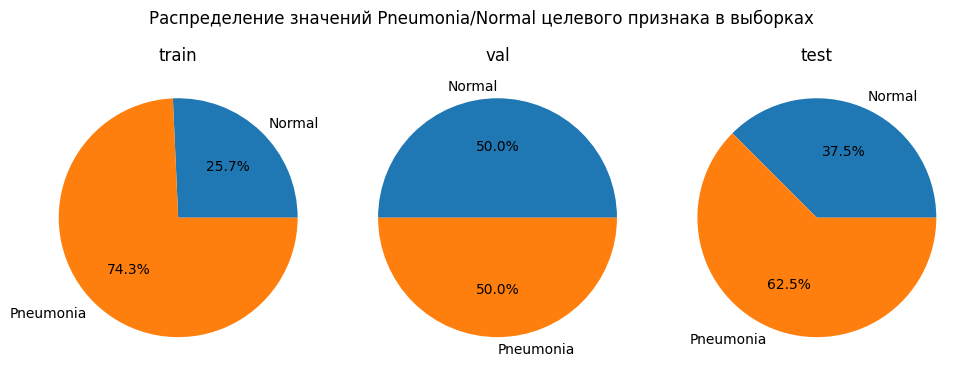

In [8]:
draw_pie(
    data=([spread[i][0], sum(spread[i][1:])] for i in ['train','val','test']),
    labels=['Normal', 'Pneumonia'],
    title="Распределение значений Pneumonia/Normal целевого признака в выборках"
         )

Также отобразим распределение значений Pneumonia {bacteria/virus}:

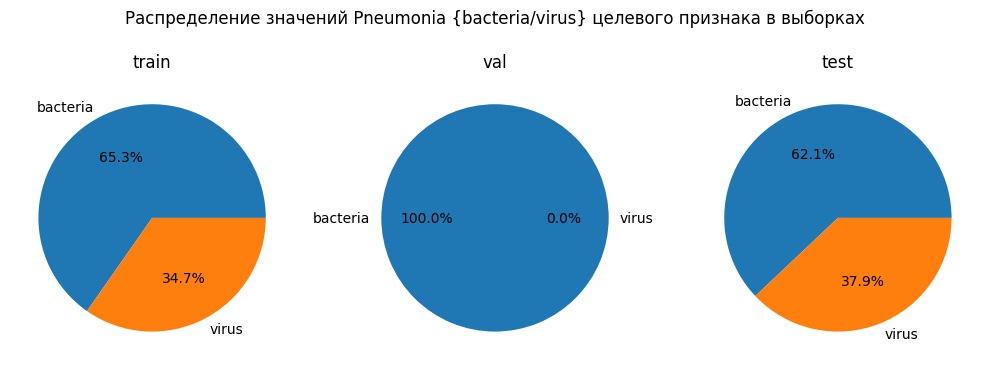

In [9]:
draw_pie(
    data=([spread[i][1], spread[i][2]] for i in ['train','val','test']),
    labels=['bacteria', 'virus'],
    title="Распределение значений Pneumonia {bacteria/virus} целевого признака в выборках"
         )

Для имеющихся изображений подсчитаем как распределены значения ширины, высоты и разрешения:

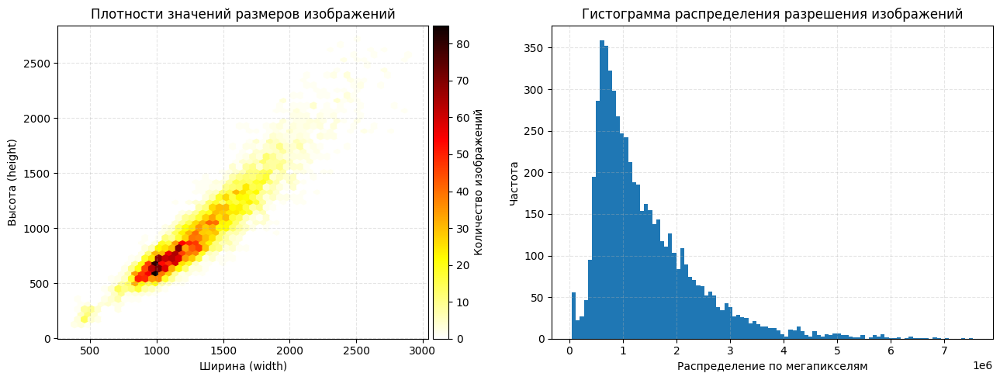

,count,mean,std,min,25%,50%,75%,max,thold,x < thold
width,5856.0,1327.9,363.5,384.0,1056.0,1281.0,1560.0,2916.0,224.0,0.0
height,5856.0,970.7,383.4,127.0,688.0,888.0,1187.0,2713.0,224.0,41.0
mega_pix,5856.0,1418908.8,970443.1,48768.0,727888.0,1136928.0,1852074.0,7532028.0,50176.0,1.0


In [10]:
image_sizes = sizes_stat(base_path)

Модель **MobileNetV2** предобучена на изображениях размером 224x224 и ожидает изображения с таким размером на входе. Для имеющихся данных
* по ширине подходят все изображения,
* 41 изображение не проходит по длине
* но, очевидно, для изображений где длина не проходит по порогу - ширина имеет чуть больший порогового размер, таким образом по порогу площади пикселей - `224x224=50176` не проходит только одно изображение.

Размер изображения напрямую влияет на качество классификации.

<a name="image_example"></a>Отобразим примеры снимков.

Для начала 9 произвольных изображений класса "NORMAL":

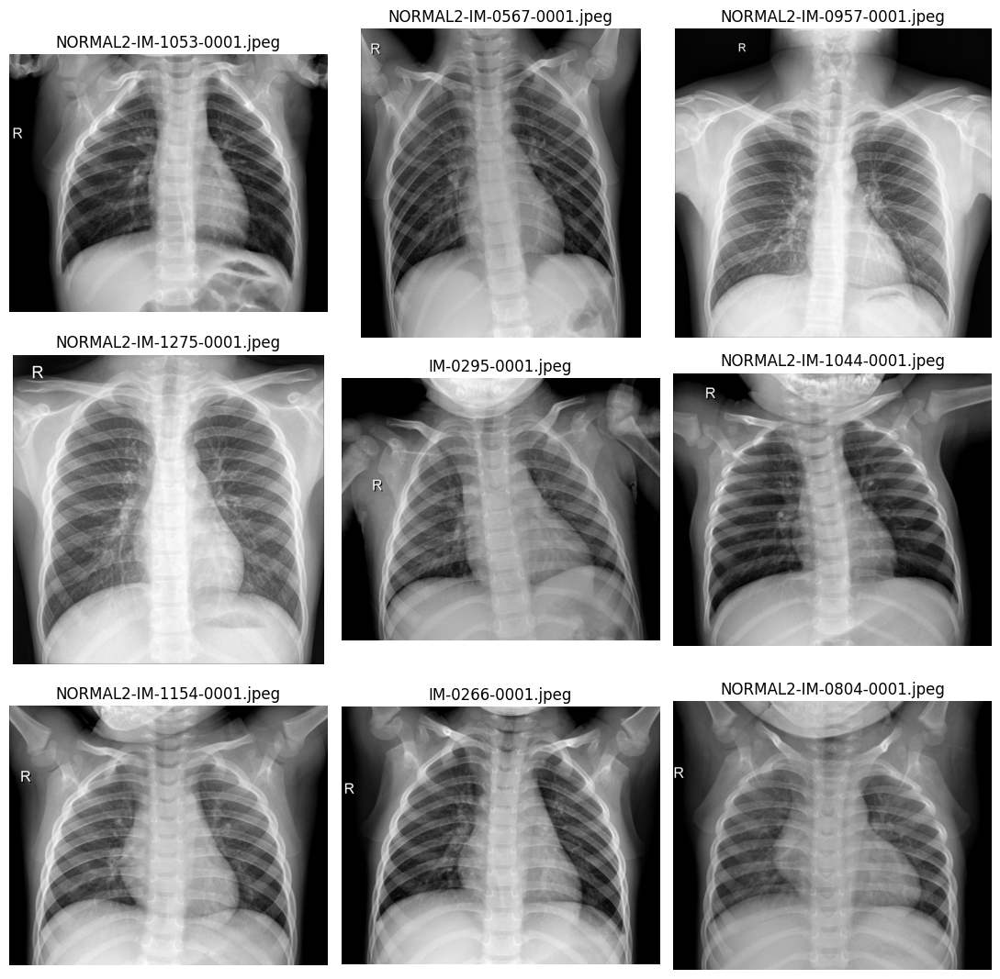

In [11]:
images_normal = ['NORMAL/' + i for i in os.listdir(os.path.join(
    base_path, 'train', 'NORMAL'))]

show_img(images_normal)

9 произвольных изображений класса "PNEUMONIA (bacteria)"

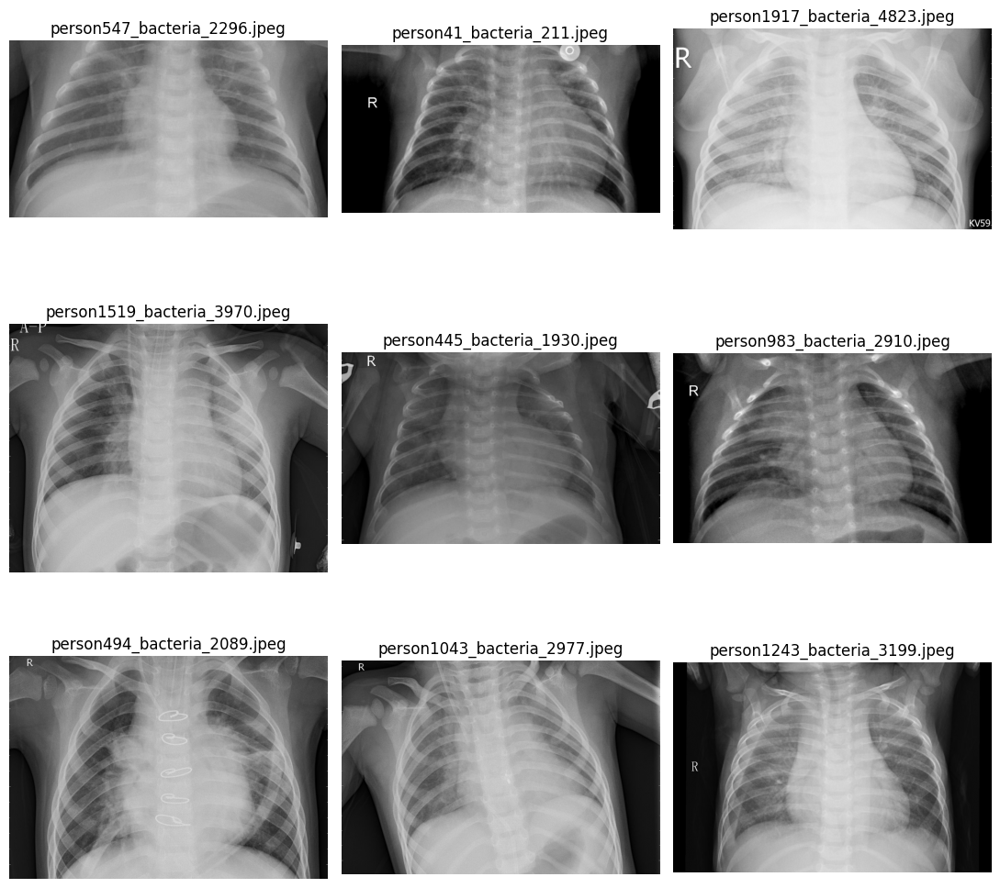

In [12]:
images_pne_bact = ['PNEUMONIA/' + i for i in os.listdir(os.path.join(
    base_path, 'train', 'PNEUMONIA')) if 'bacteria' in i]

show_img(images_pne_bact)

9 произвольных изображений класса "PNEUMONIA (virus)"

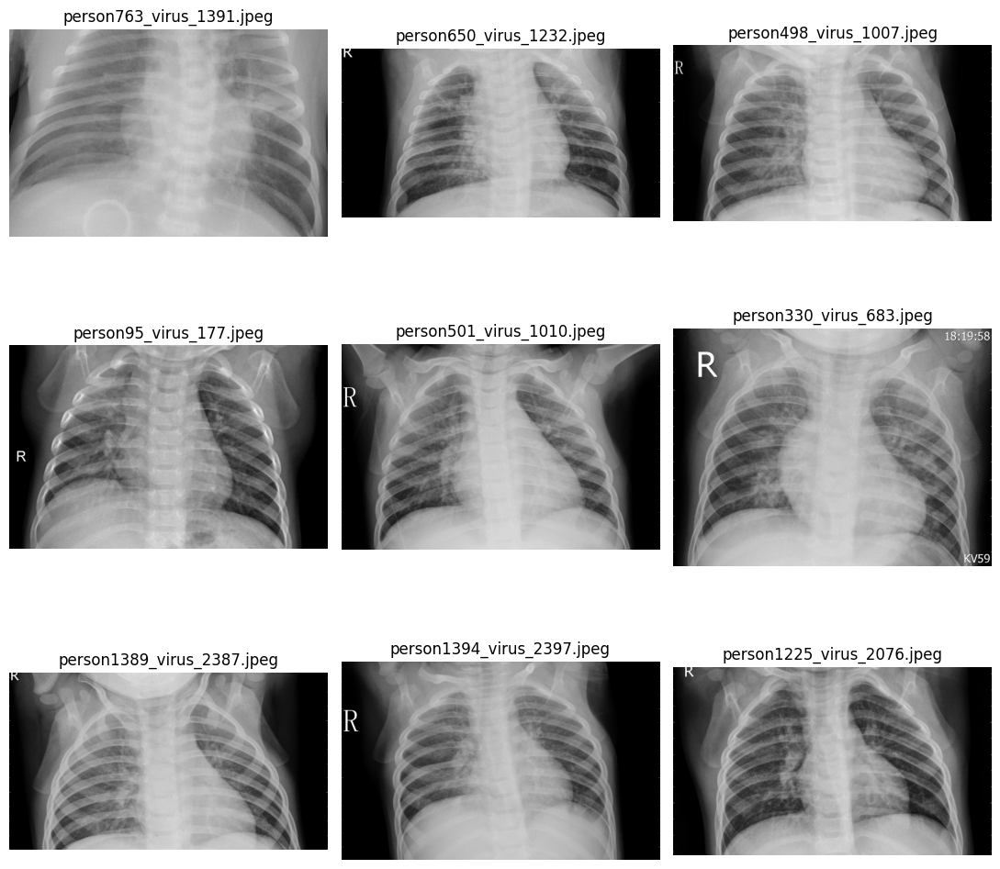

In [13]:
images_pne_vir = ['PNEUMONIA/' + i for i in os.listdir(os.path.join(
    base_path, 'train', 'PNEUMONIA')) if 'virus' in i]

show_img(images_pne_vir)

Не будучи специалистом, можно отметить, что изображения разных классов визуально отличаются друг от друга.

Проверим, насколько значимы отличия в пикселях изображений между классами "NORMAL/PNEUMONIA", для этого рассчитаем усредненную яркость пикселей (от 0/черный до 255/белый). Расчет ведется с учетом:
* в классах разное количество изображений
* каждое изображение может иметь разный размер

In [14]:
hist_pneu = compute_pixel_normalized_histogram(os.path.join(base_path, 'train', 'PNEUMONIA'))
hist_norm = compute_pixel_normalized_histogram(os.path.join(base_path, 'train', 'NORMAL'))

Отобразим рассчитанные данные в виде графиков:

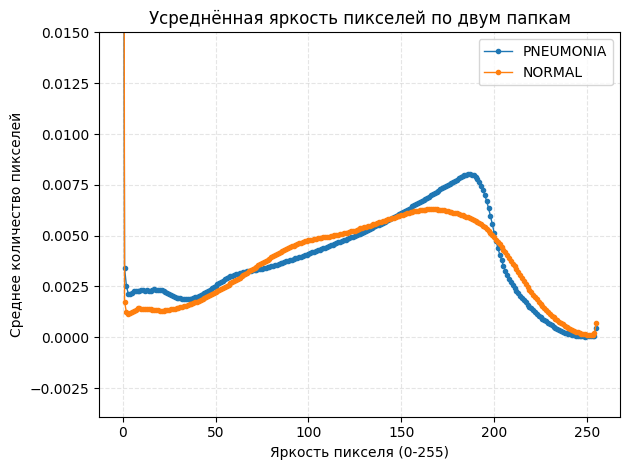

In [15]:
draw_pixel_hist(hist_pneu, hist_norm)

С учетом того, что в датасете всего 5856 изображений, разница в распределении присутствует, но слабо выражена.

**Вывод**:
* Датасет **Chest X-Ray Images (Pneumonia)** содержащий набор из 5856 изображений поделен на выборки:

Выборка|%
-|-
train|89.07%
val| 0.27%
test| 10.66%

* Наблюдается дисбаланс целевого признака. Классы целевого признака представлены следующими пропорциями (%):

target|train|val|test
-|-|-|-
PNEUMONIA|74.3|50|62.5
NORMAL|25.7|50|37.5
   

* Наблюдается дисбаланс подклассов целевого признака. Целевой признак `PNEUMONIA` разделен на подклассы `bacteria/virus` в следующих пропорциях (%):

target|train|val|test
-|-|-|-
bacteria|65.3|100|62.1
virus|34.7|0|37.9

* При предварительном просмотре примеров снимков относящихся к разным классам и подклассам можно отметить визуальные отличия.
* Анализ гистограмм распределения яркости показал, что различия между классами "NORMAL" и "PNEUMONIA" визуально выражены слабо и недостаточны для надежной классификации. Это позволяет предположить, что решающим фактором в данной задаче являются не глобальные статистики изображения (например, распределение яркости), а пространственные особенности и локальная структура изображения. Таким образом, задача относится к области компьютерного зрения и требует применения методов, способных учитывать пространственные зависимости пикселей, таких как свёрточные нейронные сети (CNN).

[Вернуться к оглавлению](#index)

## 3. Исследование моделей<a name="300"></a>
В качестве базовой модели использовалась предобученная **MobileNetV2**.

Обучение моделей производилось в отдельной тетради [project-study](#project-study.ipynb).

Листинг кода для этапов подготовки данных, сборки модели и обучения будет приведен ниже - в полном виде для базовой конфигурации, а для других вариантов будут обозначены лишь отличия.

Поскольку в валидационной папке всего 16 файлов, я проводил валидацию на тестовых данных, а валидационные данные оставил для теста.

In [16]:
train_dir = os.path.join(base_path, 'train')
val_dir   = os.path.join(base_path, 'test')
test_dir  = os.path.join(base_path, 'val')

Как альтернатива такому решению, можно было бы объединить все файлы в одну папку, и затем перегруппировать используя заданные пропорции.



Загрузка обученных в ходе исследования моделей:

In [17]:
# Загрузка базовой модели
model_base_path = '/content/drive/MyDrive/DS/chest-xray-pneumonia/MobileNetV2-cfg_1.0.keras'
model_base = tf.keras.models.load_model(model_base_path)
model_base.name = 'model_base'

# Загрузка лучшей модели
model_best_path = '/content/drive/MyDrive/DS/chest-xray-pneumonia/MobileNetV2-cfg_5.0.keras'
model_best = tf.keras.models.load_model(model_best_path)
model_best.name = 'model_best'

А также файл, содержащий данные об обучении исследуемых моделей:

In [18]:
file_result = '/content/drive/MyDrive/DS/chest-xray-pneumonia/chest-xray-MobileNetV2.pkl'
with open(file_result, 'rb') as f:
    result = pickle.load(f)

result.keys()

dict_keys(['cfg_1.0', 'cfg_1.1', 'cfg_1.2', 'cfg_2.0', 'cfg_3.0', 'cfg_4.0', 'cfg_5.0', 'cfg_5.1', 'cfg_6.0', 'cfg_6.1', 'cfg_6.2', 'cfg_7.0', 'cfg_7.1', 'cfg_4.1', 'cfg_4.2', 'cfg_8.0', 'cfg_8.1', 'cfg_8.2', 'cfg_8.3', 'cfg_9.0', 'cfg_9.1'])

[Вернуться к оглавлению](#index)

### 3.1 Базовая модель<a name="310"></a>
Рассмотрим основные этапы подготовки данных и параметры модели.

#### 3.1.1 Подготовка данных<a name="311"></a>
Размер изображений и параметры:

In [19]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

* Модель **MobileNetV2** предобучена на изображениях формата (224, 224, 3), иными словами - на цветных (три канала RGB) изображениях размером 224x224.
* Размер батча равный 32 - оптимальное значение для Colab с T4 GPU

Генерация изображений и аугментация для обучающего набора данных:

In [20]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    brightness_range=[0.9, 1.1],
)

Для валидационных данных применяем только нормализацию:

In [21]:
val_test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

* **train_datagen**
  * `rescale=1./255` - нормализация данных (приведение пикселей к диапазону [0.0, 1.0]) — стандартная практика при работе с нейронными сетями. Это улучшает сходимость модели, так как:
    * Градиенты становятся более стабильными.
    * Значения входных данных находятся в одном масштабе с активациями (например, `softmax` или `relu`), которые работают с вещественными числами.
  * Аугментация:
    * `rotation_range=10` - диапазон случайного поворота изображения в градусах
    * `width_shift_range=0.1,` - случайный сдвиг по ширине в долях
    * `height_shift_range=0.1,` - случайный сдвиг по высоте в долях
    * `zoom_range=0.1,` - диапазон случайного масштабирования в долях
    * `brightness_range=[0.9, 1.1],` - диапазон изменения яркости в долях

* **val_test_datagen** - данные нормализуются, аугментация не применяется.

Генераторы:

In [22]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    color_mode='rgb'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False,
    color_mode='rgb'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False,
    color_mode='rgb'
)

Found 5216 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Found 16 images belonging to 2 classes.


Для `train`, `val` и `test` наборов данных задаются генераторы изображений из директории (`flow_from_directory`) со следующими аргументами:
* директория с изображениями
* `target_size` и `batch_size` - заданы выше
* `class_mode='binary'` - аргумент, который указывает тип выдачи метки классов, для бинарной классификации используется `'binary'`
* `shuffle` - данные перемешиваются для `train`, и не перемешиваются для `val` и `test`
* `color_mode='rgb'` - преобразование изображений к цветному формату: датасет состоит из чернобелых изображений, но модель MobileNetV2 обучена на цветных.

[Вернуться к оглавлению](#index)

#### 3.1.2 Сборка модели<a name="312"></a>
Загрузка **MobileNetV2**:
```
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False
```

* `MobileNetV2(input_shape=(224, 224, 3))` название модели и формат входных изображений
* `include_top=False` - отбрасывание "головных" слоев модели MobileNetV2, используется только "backbone"
* `weights='imagenet'` - веса модели предобученные на датасете цветных изображений ImageNet.

Добавление слоев классификации:
```
model = Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.5),
    layers.Dense(1, activation='sigmoid')
])
```
* `Sequential()` - задается класс Sequential. Этот класс применяется для моделей, в которых слои идут последовательно.
* `base_model` - первый слой - это предобученная **MobileNetV2** "без верхушки"
* `layers.GlobalAveragePooling2D()` - слой для уменьшения размерности. После **MobileNetV2** выходной тензор имеет форму (`batch_size`, `height`, `width`, `channels`), например: `(None, 7, 7, 1280)`. Этот слой превращает его в вектор `(None, 1280)`, усредняя значения по каждому каналу.
* `layers.Dense(128, activation='relu')` - голова модели. Добавляется небольшая нейросеть, которая принимает "признаки", извлечённые MobileNetV2, и пытается решить задачу классификации.
  * `ReLU` — нелинейная функция активации, которая помогает модели учиться сложным зависимостям.
  * Размер `128` был выбран как компромисс между мощностью и простотой.
* `Dropout(0.5)` - защита от переобучения. Случайно "выключает" 50% нейронов на каждом шаге обучения. Это помогает модели быть более устойчивой и обобщать лучше.
* `Dense(1, activation='sigmoid')` — финальный слой. Для бинарной классификации нужен один нейрон с сигмоидой. Он возвращает вероятность принадлежности к одному из двух классов:
  * 0 - здоровый пациент
  * 1 - пневмония

Компиляция модели:
```
model.compile(
    optimizer=Adam(),
    loss='binary_crossentropy',
    metrics=[
        'AUC',
        'Recall',
        'Precision',
        'accuracy'
    ]
)
```
* `optimizer=Adam()` - оптимизатор **Adam**. По умолчанию используется значение `learning_rate=0.001`
* `loss='binary_crossentropy'` - функция потерь для бинарной классификации
* `metrics=` - фиксация и вывод метрик: 'AUC', 'Recall', 'Precision', 'accuracy'
Вывод `summary()` для полученной модели:
```
Model: "sequential"
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘
 Total params: 2,422,081 (9.24 MB)
 Trainable params: 164,097 (641.00 KB)
 Non-trainable params: 2,257,984 (8.61 MB)
 ```

[Вернуться к оглавлению](#index)

#### 3.1.3 Обучение модели<a name="313"></a>
```
EPOCHS = 10

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=val_generator
)
```
* `train_generator` - генератор обучающих данных
* `epochs=10` - количество эпох обучения
* `validation_data=val_generator` - генератор валидационных данных

Отображение метрик, полученных при обучении базовой модели:

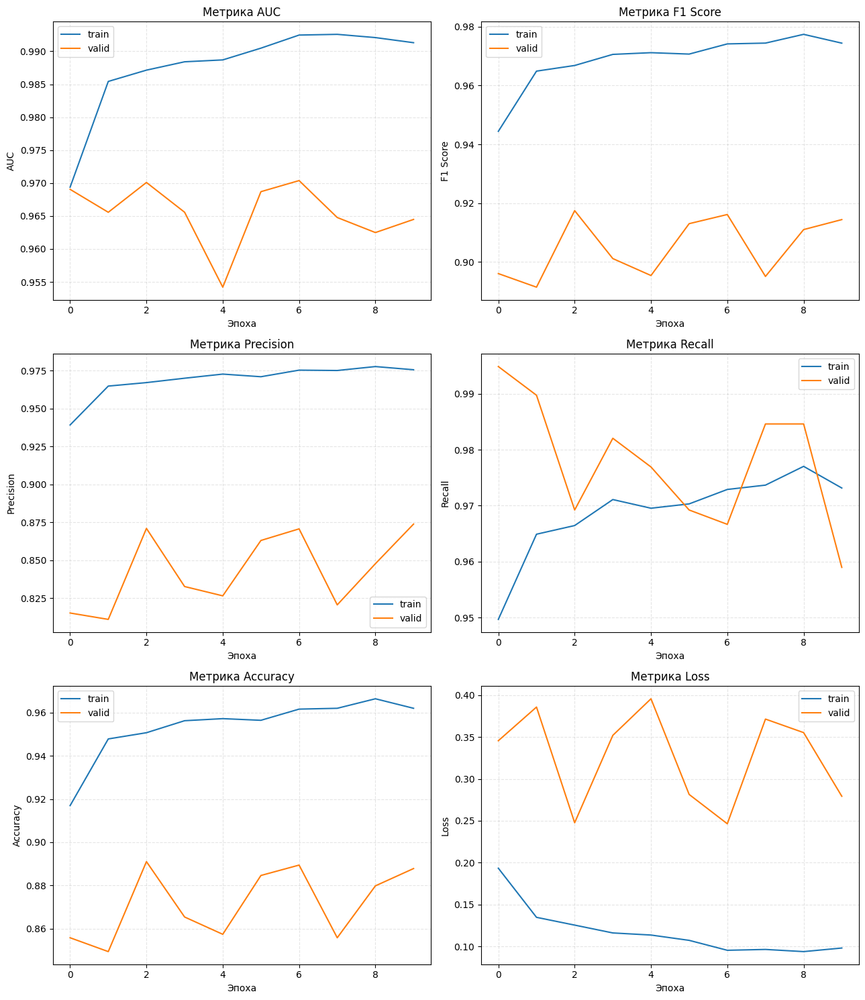

In [23]:
plot_training_history(result['cfg_1.0'])

Можно отметить нестабильность метрик по эпохам, а также видимый разрыв качества между обучением и валидацией.

Для "для стабилизации" качества базовой модели я попробовал обучить еще несколько вариантов варьируя `learning_rate`:

Модель | `learning_rate`
-|-
`cfg_1.0` | 0.001
`cfg_1.1` | 0.0001
`cfg_1.2` | 0.00005

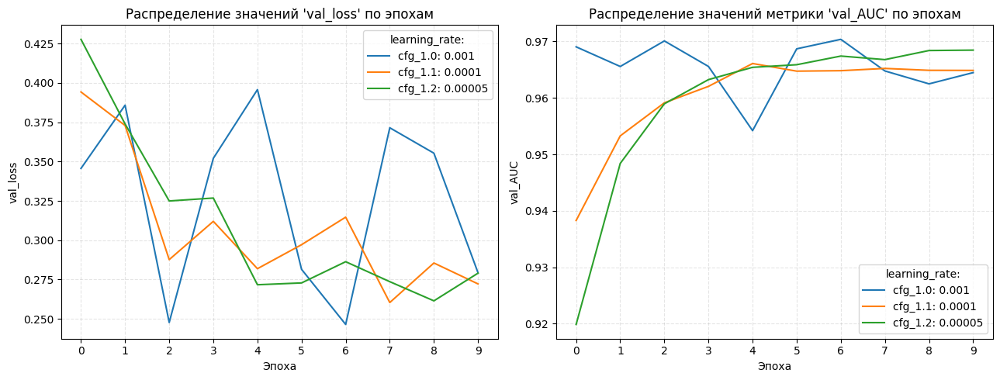

In [24]:
models_compare(
    ['cfg_1.0', 'cfg_1.1', 'cfg_1.2'],
    ['0.001','0.0001','0.00005'],
    "learning_rate:"
    )

Скорость обучения `lr=0.00005` показала более стабильные метрики, поэтому продолжу исследование с этим значением.

In [25]:
metrics_compare(['cfg_1.0', 'cfg_1.2'])

,1.0,1.2
AUC,0.991,0.987
Precision,0.976,0.968
Recall,0.973,0.969
accuracy,0.962,0.953
loss,0.098,0.127
val_AUC,0.964,0.968
val_Precision,0.874,0.857
val_Recall,0.959,0.979
val_accuracy,0.888,0.885
val_loss,0.279,0.279


**Вывод**:
* Предобученная модель MobileNetV2 довольно неплохо справляется с задачей классификации даже при базовой конфигурации. Метрики на валидации:
  * val_AUC 0.968
  * val_Precision	0.857
  * val_Recall	0.979
* Уменьшение скорости обучения с 0.001 до 0.00005 немного сократило разрыв между метриками.

[Вернуться к оглавлению](#index)

### 3.2 Баланс классов<a name="320"></a>

Для рассматриваемого датасета наблюдается дисбаланс классов:
```
- chest_xray/ (0)
    - test/ (0)
        - PNEUMONIA/ (390)
        - NORMAL/ (234)
    - val/ (0)
        - PNEUMONIA/ (8)
        - NORMAL/ (8)
    - train/ (0)
        - PNEUMONIA/ (3875)
        - NORMAL/ (1341)
```

Конкретно для тренировочных данных соотношение PNEUMONIA / NORMAL составляет 74.3% к 25.7%.

Можно отметить, что такой дисбаланс, когда изображений с PNEUMONIA больше, чем NORMAL, "выгоден" для данной задачи - модель будет хорошо распознавать класс "PNEUMONIA", и чуть менее хорошо "NORMAL", то есть, если класс PNEUMONIA=1, NORMAL=0, тогда количество ложноотрицательных ответов (FN) будет меньше и метрика Recall выше:

$Recall = \frac{TP}{TP+FN}$

Что и важно для данной задачи - не пропустить случай пневмонии.

Тем не менее, **модель должна стремиться к балансу** - уметь хорошо отделять оба класса. Если модель будет определять все случаи как "PNEUMONIA", то FN будет равно нулю и метрика Recall равна 100%. Но и толку от такой модели не будет...

Если в данных наблюдается дисбаланс по классам, то необходимо применять балансировку, например `class_weight`.

Для рассматриваемых данных значения `class_weight` составляют:

In [26]:
class_weights = compute_class_weight('balanced',
                                     classes=np.unique(train_generator.classes),
                                     y=train_generator.classes)
class_weights = dict(enumerate(class_weights))
class_weights

{0: np.float64(1.9448173005219984), 1: np.float64(0.6730322580645162)}

Метод `class_weight` работает следующим образом:
* При вычислении loss-функции (`binary_crossentropy`) ошибка умножается на вес класса.
* Если модель ошиблась на NORMAL (редкий класс), то ошибка увеличивается, градиенты сильнее, модель быстрее исправляется.

Отобразим метрики `val_loss` и `val_AUC` для модели с опцией `class_weight` и без нее:

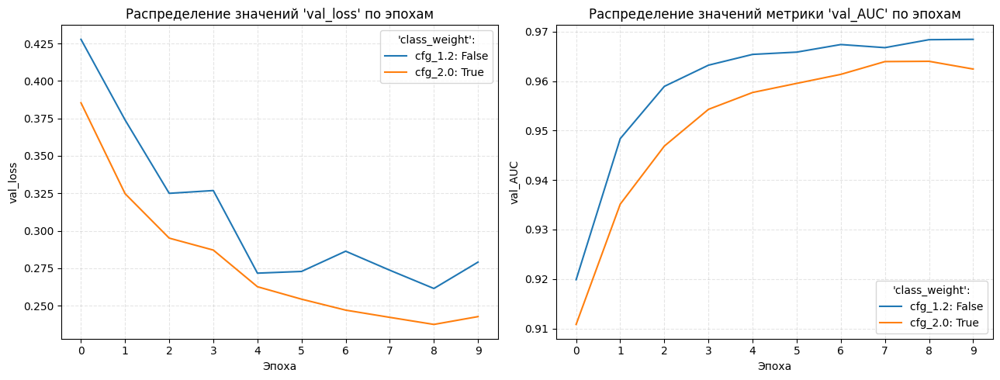

In [27]:
models_compare(['cfg_1.2', 'cfg_2.0'],
               ['False','True'],
               "'class_weight':")

Отобразим значения метрики для рассматриваемых моделей:

In [28]:
metrics_compare(['cfg_1.2', 'cfg_2.0'])

,1.2,2.0
AUC,0.987,0.986
Precision,0.968,0.985
Recall,0.969,0.927
accuracy,0.953,0.935
loss,0.127,0.152
val_AUC,0.968,0.962
val_Precision,0.857,0.891
val_Recall,0.979,0.941
val_accuracy,0.885,0.891
val_loss,0.279,0.243


**Выводы**:
* Как видно, функция потерь на валидации у модели с балансом классов ниже.
* В то же время, метрики AUC и Recall немного снизились, а Precision - увеличилась.
* Наблюдаемое поведение нормально, особенно при умеренном дисбалансе. Небольшое ухудшение AUC при улучшении loss обычно приемлемо, если важна сбалансированная ошибка по классам.
* Если важно сохранить высокий AUC, можно попробовать:
  * более мягкие веса классов (не полная балансировка)
  * другие методы борьбы с дисбалансом (oversampling)
* Для медицинских задач часто важнее иметь хороший баланс между чувствительностью и специфичностью, чем абсолютное значение AUC.
* Задача поиска оптимального значения `class_weights` относится к тонкой настройке и определяется поставленной задачей.

[Вернуться к оглавлению](#index)

### 3.3 Разморозка слоев<a name="330"></a>
Текущая конфигурация модели включает предобученные слои **MobileNetV2** (backbone).
```
backbone = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
backbone.trainable = False
```
Они уже хорошо предобучены, поэтому для текущей задачи "заморожены" - `backbone.trainable = False`.

Обычно слои базовой модели замораживаются, когда модель обучается на недостаточно большом объеме данных - если не заморозить, то модель скорее всего переобучится - будут высокие метрики на обучении и низкие на валидации.

Проверим - возможно, объема данных в имеющемся датасете достаточно, чтобы хорошо обучить базовую модель. Проведем обучение с параметром `backbone.trainable = True`

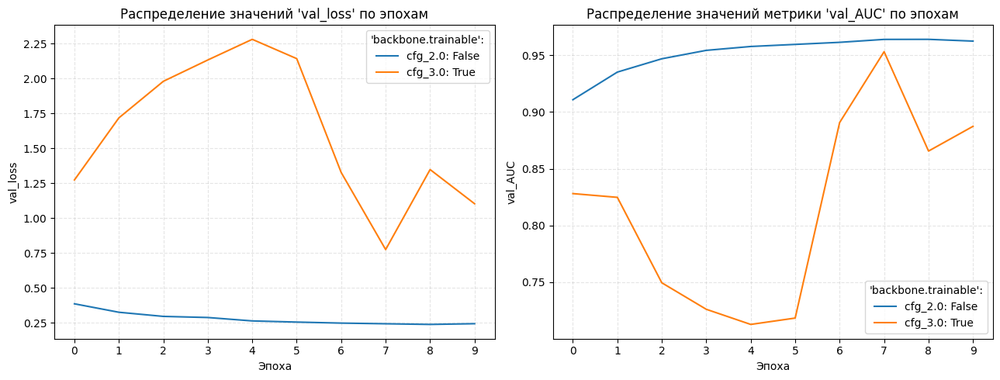

In [29]:
models_compare(['cfg_2.0','cfg_3.0'],
               ['False', 'True'],
               "'backbone.trainable':")

**Вывод**:
* Как видно, при одинаковом количестве эпох обучения, модель с обучаемым backbone показывает заметно худшие метрики качества, чем модель с фиксированными слоям.
* Можно продолжить исследование, увеличив количество эпох и подобрав оптимальное значение `learning_rate`, однако это приведет к усложнению модели и увеличению времени обучения.

[Вернуться к оглавлению](#index)

### 3.4 Аугментация: поворот изображений<a name="340"></a>
Поскольку датасет состоит из стандартизированных рентгеновских снимков:
> > *Chest X-ray images (anterior-posterior) were selected from retrospective cohorts of pediatric patients*

> '*anterior-posterior images*' - обозначают рентгеновскую проекцию, при которой излучение направлено от передней части тела (anterior) к задней (posterior).

Простым доказательством этого факта служит одинаковое расположение буквы **R** на [примерах снимков](#image_example).

Таким образом, не очевидно как модель отреагирует если изображения в обучающем наборе будут отражены горизонтально, вертикально или двумя вариантами сразу.

В базовой модели я намеренно не использовал эту опцию.

Сравним качество моделей, обученных на изображениях с различной опцией поворота:

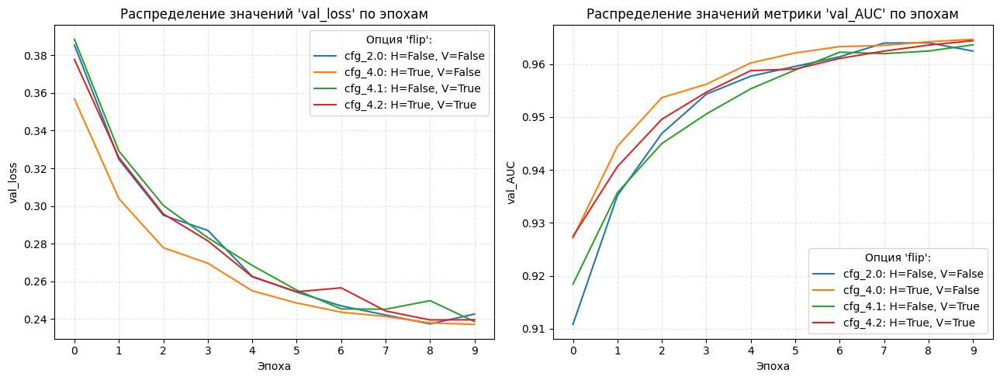

In [30]:
cfg_list = ['cfg_2.0','cfg_4.0', 'cfg_4.1', 'cfg_4.2']
models_compare(cfg_list,
               ['H=False, V=False','H=True, V=False',
                'H=False, V=True', 'H=True, V=True'],
               "Опция 'flip':"
               )

Отобразим метрики для сравниваемых моделей:

In [31]:
metrics_compare(cfg_list)

,2.0,4.0,4.1,4.2
AUC,0.986,0.988,0.983,0.983
Precision,0.985,0.984,0.981,0.980
Recall,0.927,0.937,0.923,0.927
accuracy,0.935,0.942,0.930,0.932
loss,0.152,0.141,0.165,0.165
val_AUC,0.962,0.965,0.964,0.964
val_Precision,0.891,0.922,0.911,0.927
val_Recall,0.941,0.913,0.918,0.910
val_accuracy,0.891,0.897,0.893,0.899
val_loss,0.243,0.237,0.239,0.240


**Вывод**:
* добавление опции `horizontal_flip` для тренировочных изображений улучшило баланс метрик:
  * val_Precision, val_AUC, val_accuracy - увеличились, но
  * val_Recall - немного снизилась
* обучение при активной опции `vertical_flip` существенно не повлияло на результат.
* обучение с активными `horizontal_flip` и `vertical_flip` также не оказало заметного влияния.

[Вернуться к оглавлению](#index)

### 3.5 Размерность слоя Dense()<a name="350"></a>
В базовой конфигурации модели мы используем следующие слои:
```
backbone,
layers.GlobalAveragePooling2D(),
layers.Dense(128, activation='relu'),
layers.Dropout(0.5),
layers.Dense(1, activation='sigmoid')
```
В качестве второго слоя нашей "головы" используется "густой" слой Dense() включающий 128 нейронов. Количество нейронов выбрано как компромисс между мощностью и простотой.

Попробую обучить модели с 256 и 64 нейронами в данном слое и оценить качество.

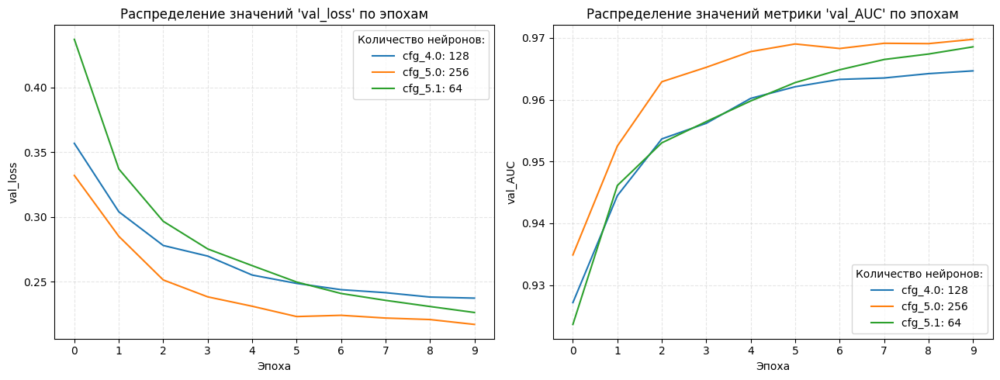

In [32]:
cfg_list = ['cfg_4.0', 'cfg_5.0', 'cfg_5.1']
models_compare(cfg_list, ['128', '256', '64'], "Количество нейронов:")

Метрики рассматриваемых моделей:

In [33]:
metrics_compare(cfg_list)

,4.0,5.0,5.1
AUC,0.988,0.987,0.983
Precision,0.984,0.985,0.982
Recall,0.937,0.938,0.928
accuracy,0.942,0.943,0.933
loss,0.141,0.142,0.168
val_AUC,0.965,0.970,0.969
val_Precision,0.922,0.919,0.915
val_Recall,0.913,0.931,0.936
val_accuracy,0.897,0.905,0.905
val_loss,0.237,0.217,0.226


**Вывод**:
* Можно отметить, что модель с 256 нейронами в слое Dense() показала лучшие метрики, чем 128 и 64.
* При этом, время обучения практически не отличается между 256 и 128, а модель с 64 нейронами обучается немного быстрее.

[Вернуться к оглавлению](#index)

### 3.6 Подбор оптимальной скорости обучения<a name="360"></a>
При обучении базового варианта модели я остановился на значении `learning_rate=0.00005`. Такое значение обеспечивало стабильность метрик.

А если еще уменьшить шаг - улучшиться ли качество модели?

Сверим качество двух моделей с `learning_rate` `0.00005` и `0.00001`:

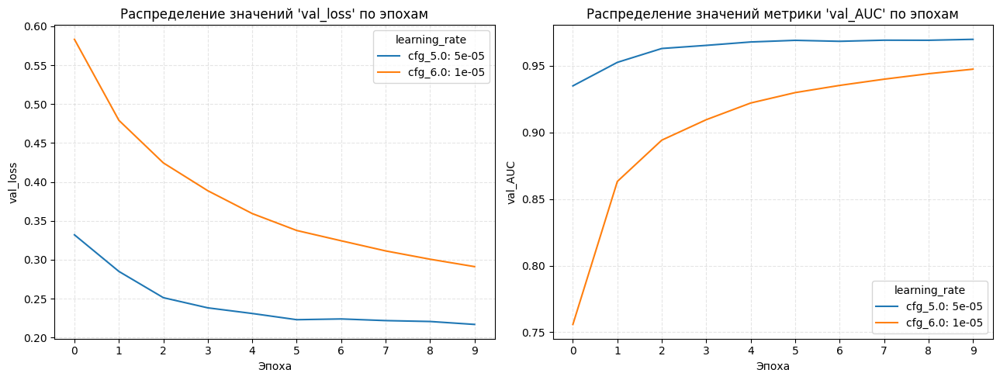

In [34]:
cfg_list = ['cfg_5.0', 'cfg_6.0']
models_compare(cfg_list, ['5e-05', '1e-05', 'LRS'], "learning_rate")

При значении `learning_rate=0.00001` функция потерь начинает с более грубых значений и далее мелкими шагами (мельче, чем при 0.00005) поэтапно улучшает качество. На 10-й эпохе так и не догоняет модель с `learning_rate=0.00005`.

Есть предположение, что при таком шаге модели потребуется больше эпох для обучения.

Можно попробовать обучить модель с  динамическим значением `learning_rate`. Ожидается, что модель начнет с хорошего старта, такого как `learning_rate=0.00005` и затем будет стремиться к более лучшему значению качества за счет более точного шага.

В библиотеке Keras есть инструменты для реализации динамического значения `learning_rate`, например `LearningRateScheduler` и `CosineDecay`.

С помощью **LearningRateScheduler** можно вручную задать значение `learning_rate` для каждой эпохи:
```
def lr_scheduler(epoch, lr):
    if  0 <= epoch <= 2:
        return 0.00005
    else:
        return 0.00001

lr_callback = LearningRateScheduler(lr_scheduler)

history = model.fit(
    train_generator,
    epochs=EPOCHS,
    callbacks=[lr_callback]
)
```
Как можно заметить, здесь задана `learning_rate=0.00005` для 0-2 эпох (Keras ведет нумерацию эпох с нуля, хоть в логе и выводит первое значение=1) и `0.00001` для остальных.

**CosineDecay** изменяет `learning_rate` по косинусной кривой: сначала большой шаг → постепенно уменьшается → почти нулевой в конце.
```
# CosineDecay
initial_learning_rate = 0.0001
decay_steps = len(train_generator) * 10  # 10 эпох

lr_schedule = tf.keras.optimizers.schedules.CosineDecay(
    initial_learning_rate,
    decay_steps
    )

# Компиляция модели
model.compile(
    optimizer=Adam(learning_rate=lr_schedule), # CosineDecay
    loss='binary_crossentropy',
    metrics=['AUC', 'accuracy']
)
```
Основные параметры:
* `initial_learning_rate` - начальное значение `learning_rate`
* `decay_steps` - общее количество шагов, которое определяется как количество шагов в одной эпохе (`len(train_generator)`) умножить на количество эпох.

Отобразим на графиках результат для моделей с разными `learning_rate`:

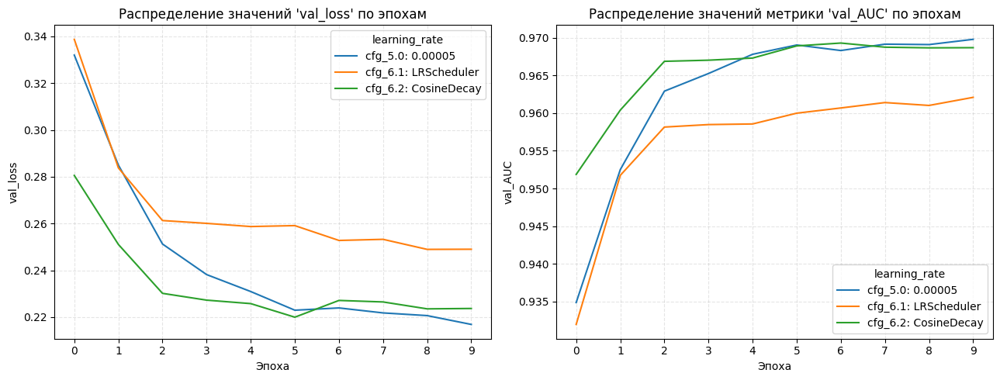

In [35]:
cfg_list = ['cfg_5.0',  'cfg_6.1', 'cfg_6.2']
models_compare(cfg_list, ['0.00005',  'LRScheduler', 'CosineDecay'],"learning_rate")

Сравнение метрик:

In [36]:
metrics_compare(cfg_list)

,5.0,6.1,6.2
AUC,0.987,0.984,0.990
Precision,0.985,0.982,0.989
Recall,0.938,0.927,0.940
accuracy,0.943,0.933,0.947
loss,0.142,0.162,0.126
val_AUC,0.970,0.962,0.969
val_Precision,0.919,0.892,0.904
val_Recall,0.931,0.936,0.941
val_accuracy,0.905,0.889,0.901
val_loss,0.217,0.249,0.224


**Вывод**:
* Попытка уменьшить скорость обучения `0.00005` -> `0.00001` не дала прироста качества модели. Даже наоборот, при том же количестве эпох (10), модель показала худшее качество.
* Попытки использовать инструменты LearningRateScheduler и CosineDecay для установки динамического значения `learning_rate` тоже не дали прироста.
* Величина `learning_rate` напрямую влияет на качество модели - как большое, так и слишком маленькое значение ведут к ухудшению метрик. Поиск оптимального значения `learning_rate` - задача тонкой настройки.
* Значение `learning_rate=0.00005` остается наиболее оптимальным.

[Вернуться к оглавлению](#index)

### 3.7 Количество слоев Dense()<a name="370"></a>
В базовой конфигурации используется один "густой" слой Dense() со 128 нейронами.

Позднее было определено, что слой с 256 нейронами дает лучшие метрики качества.

Можно попробовать добавить еще один "густой" слой и проверить как это повлияет на качество обучения.

Ниже приведены сравнительные графики для следующих конфигураций моделей:

Модель | Конфигурация
- | -
`cfg_5.0` | <code>backbone,<br>layers.GlobalAveragePooling2D(),<br>layers.Dense(256, activation='relu'),<br>layers.Dropout(0.5),<br>layers.Dense(1, activation='sigmoid')</code> | 2
`cfg_7.0` | <code>backbone,<br>layers.GlobalAveragePooling2D(),<br>layers.Dense(256, activation='relu'),<br>layers.Dense(128, activation='relu'),<br>layers.Dropout(0.5),<br>layers.Dense(1, activation='sigmoid')</code>
`cfg_7.0` | <code>backbone,<br>layers.GlobalAveragePooling2D(),<br>layers.Dense(128, activation='relu'),<br>layers.Dense(64, activation='relu'),<br>layers.Dropout(0.5),<br>layers.Dense(1, activation='sigmoid')</code>

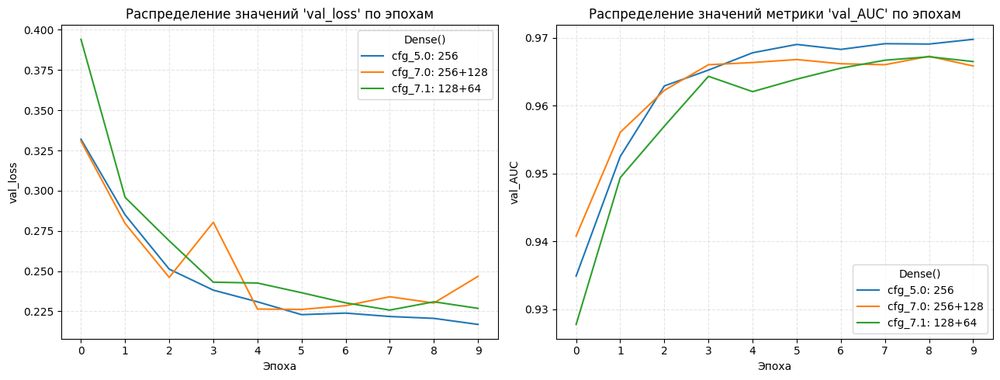

In [37]:
cfg_list = ['cfg_5.0',  'cfg_7.0', 'cfg_7.1']
models_compare(cfg_list,
               ['256',  '256+128', '128+64'],
               "Dense()"
               )

**Вывод**:
* Усложнение структуры сети не помогло улучшить ее качество.
* Варианты с двумя Dense() слоями - `256+128` и `128+64` - не превзошли по качеству модель с одним Dense() слоем с 256 нейронами.

[Вернуться к оглавлению](#index)

### 3.8 Количество эпох обучения<a name="380"></a>
Попробовал оценить повлияет ли увеличение количества эпох на качество модели.
* `cfg_8.0` - для начала я взял модель `cfg_5.0` и просто увеличил количество эпох до 20. Добавил опцию `EarlyStopping`, чтобы модель прекратила обучения если `val_AUC` не будет улучшаться в течение 3 эпох.
* `cfg_8.1` - то же, что и в предыдущей модели, но уменьшил `learning_rate`: `0.00005` -> `0.00001`

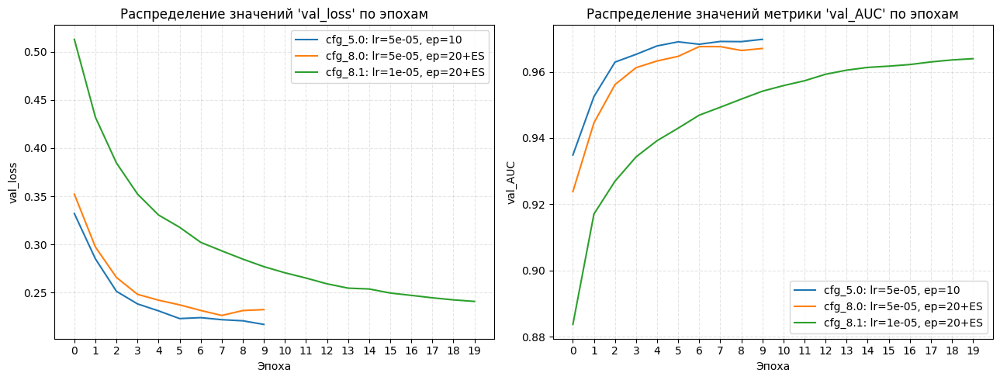

In [38]:
cfg_list = ['cfg_5.0',  'cfg_8.0', 'cfg_8.1']
models_compare(cfg_list,
              ['lr=5e-05, ep=10',  'lr=5e-05, ep=20+ES', 'lr=1e-05, ep=20+ES'],
               )

* Для модели с `learning_rate=0.00005` и количеством эпох равным 20 обучение прекратилось на той же 10 эпохе.
* Для модели с `learning_rate=0.00001` обучение продолжалось все 20 эпох, но так и не догнало предыдущие варианты.

Далее я решил вернуться к варианту модели с размороженными слоями `backbone.trainable = True`
* `cfg_8.2` - сначала я обучил модель с постоянным значением `learning_rate=0.00001` и `backbone.trainable = True` на 20 эпохах и опцией `EarlyStopping` равной 5 для метрики `val_AUC`
* `cfg_8.3` - затем обучил модель с помощью `LearningRateScheduler` с таким алгоритмом:
  * 0..2 эпоха - `learning_rate=0.0001`
  * 3..20 эпоха - `learning_rate=0.00001`

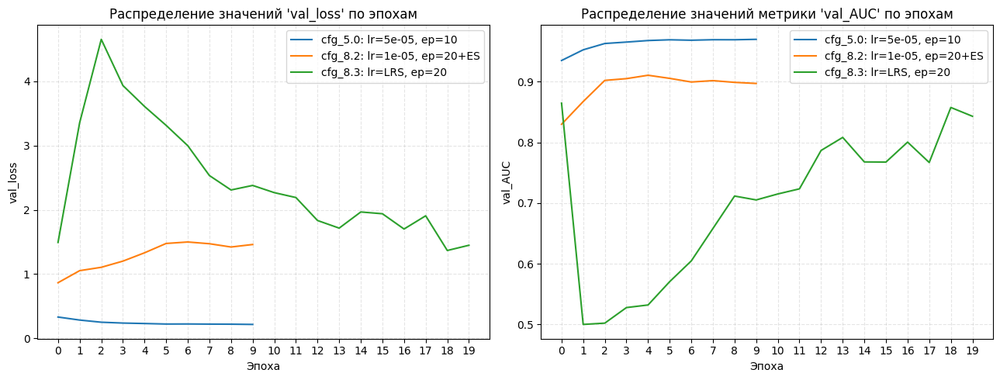

In [39]:
cfg_list = ['cfg_5.0', 'cfg_8.2', 'cfg_8.3']
models_compare(cfg_list,
               ['lr=5e-05, ep=10',  'lr=1e-05, ep=20+ES', 'lr=LRS, ep=20'],
               )

* при постоянном значении `learning_rate=0.00001` модель перестала обучаться на 10 эпохе (как и прежде)
* при использовании `LearningRateScheduler` не удалось достичь приемлемого качества модели за выделенные 20 эпох.

**Вывод**:
* Для рассмотренных вариантов моделей самым оптимальным остался вариант с постоянным значением `learning_rate=0.00005` и `backbone.trainable = True`.
* Увеличение количества эпох не дало прироста качества как ни для модели с замороженным `backbone`, так и размороженным.

[Вернуться к оглавлению](#index)

### 3.9 Метод интерполяции изображений<a name="390"></a>
В следующем разделе я занимался построением тепловой карты активации класса и рассматривал вопрос [интерполяции изображения выходного слоя](#heatmap), имеющего у модели MobileNetV2 размер 7x7 до размера изображения 224x224.

Когда маленькое изображение масштабируется до большого - метод интерполяции играет важную роль.

Я подумал над тем, что помимо интерполяции тепловой карты, в процессе обучения изображения также меняют размер на этапе подготовки `train_datagen`, правда, обычно происходит уменьшение изображений.

По умолчанию `ImageDataGenerator` применяет *билинейную* интерполяцию при изменении размера изображений.

На примере двух файлов - <ins>самого большого</ins> и <ins>самого маленького</ins> по разрешению - проверим как метод интерполяции влияет на качество финального изображения:

In [40]:
# отбор самого большого и самого маленького файлов и вывод их параметров:
df_size = pd.DataFrame(image_sizes).sort_values(by='mega_pix', ascending=False).iloc[[0, -1], :]
display(df_size)

# создание переменных с именами данных файлов:
img_big, img_small = df_size['file'].values

,file,width,height,mega_pix
5279,train/NORMAL/NORMAL2-IM-1257-0001.jpeg,2916,2583,7532028
1721,train/PNEUMONIA/person407_virus_811.jpeg,384,127,48768


Определение функции, которая на вход получает изображение и преобразует размер до установленного (`new_size`) с помощью билинейной и бикубической интерполяции:

Размер оригинального изображения: (2916, 2583)


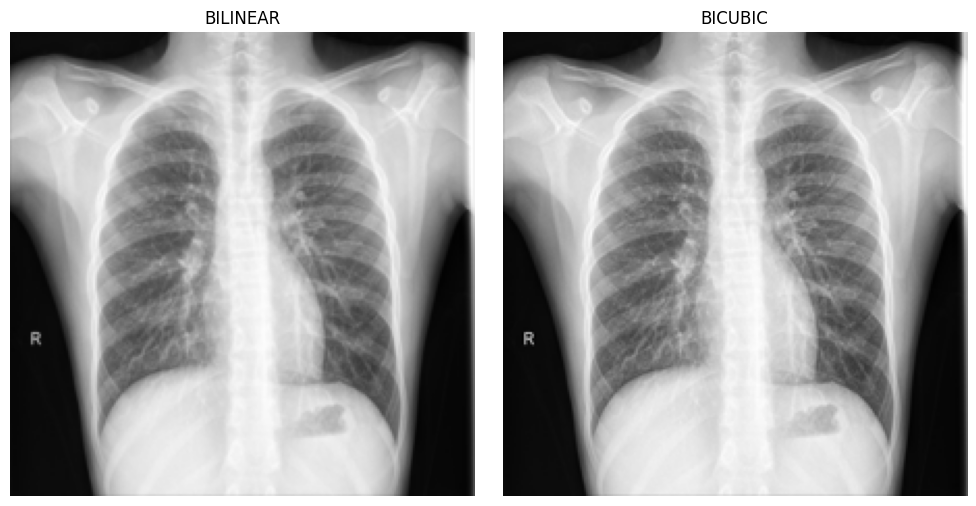

In [41]:
def intpol_method_compare(img, new_size=(224, 224)):
    """
    Функция для отображения двух версий одного изображения
    отмасштабированных с помощью разных методов интерполяции:
    - BILINEAR
    - BICUBIC
    """

    # Путь к изображению
    img_path = os.path.join(base_path, img)

    # Открытие изображения
    original = Image.open(img_path).convert("RGB")

    print('Размер оригинального изображения:', original.size)

    # Масштабирование с BILINEAR
    img_bilinear = original.resize(new_size, Image.BILINEAR)

    # Масштабирование с BICUBIC
    img_bicubic = original.resize(new_size, Image.BICUBIC)

    # Отображение:
    fig, axes = plt.subplots(1, 2, figsize=(10,5))
    axes[0].imshow(img_bilinear) # 0
    axes[0].set_title("BILINEAR")
    axes[0].axis('off')
    axes[1].imshow(img_bicubic)  # 1
    axes[1].set_title("BICUBIC")
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    return img_bilinear, img_bicubic

img_bilinear, img_bicubic = intpol_method_compare(img_big)

Разница на глаз едва ли заметна 🤨

Можно рассчитать разность пикселей полученных изображений - для этого в библиотеке `PIL` есть метод `ImageChops.difference`. Поскольку разница, как правило, не заметна на глаз - я отображу оригинальное изображение с разницей пикселей и x200 увеличенным контрастом:<a name="difference"></a>

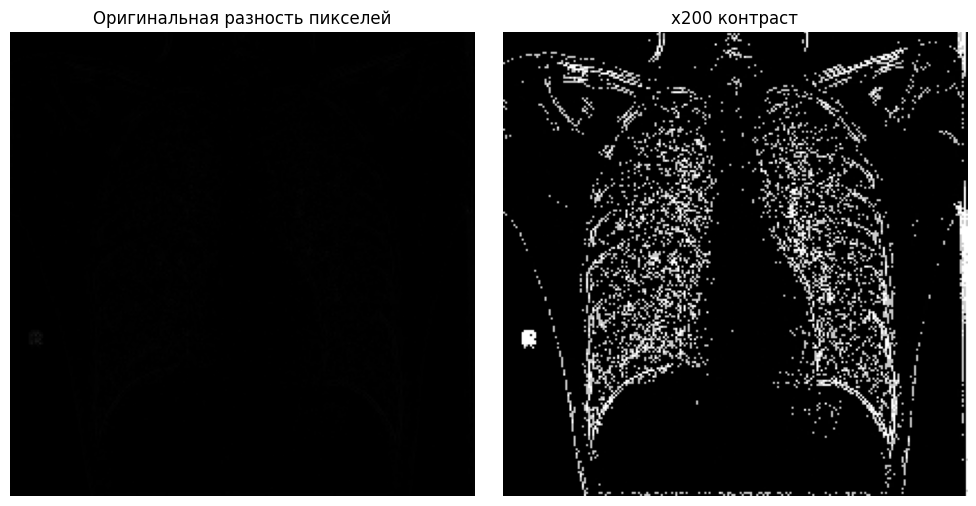

In [42]:
def img_diff(img_1, img_2):
    """
    Функция для отображения разности пикселей двух изображений:
    - отображается реальная разница
    - разница с увеличенным x200 контрастом
    """
    # Разность пикселей: оригинал
    diff = ImageChops.difference(img_1, img_2)

    # Разность пикселей: x200 контраст
    diff_contrasted = ImageEnhance.Contrast(diff.convert('RGB')).enhance(200)

    fig, axes = plt.subplots(1, 2, figsize=(10,5))
    axes[0].imshow(diff)             # 0
    axes[0].set_title("Оригинальная разность пикселей")
    axes[0].axis('off')
    axes[1].imshow(diff_contrasted)  # 1
    axes[1].set_title("x200 контраст")
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    return diff

diff_big = img_diff(img_bilinear, img_bicubic)

Теперь применим аналогичные операции с самым маленьким файлом:

Размер оригинального изображения: (384, 127)


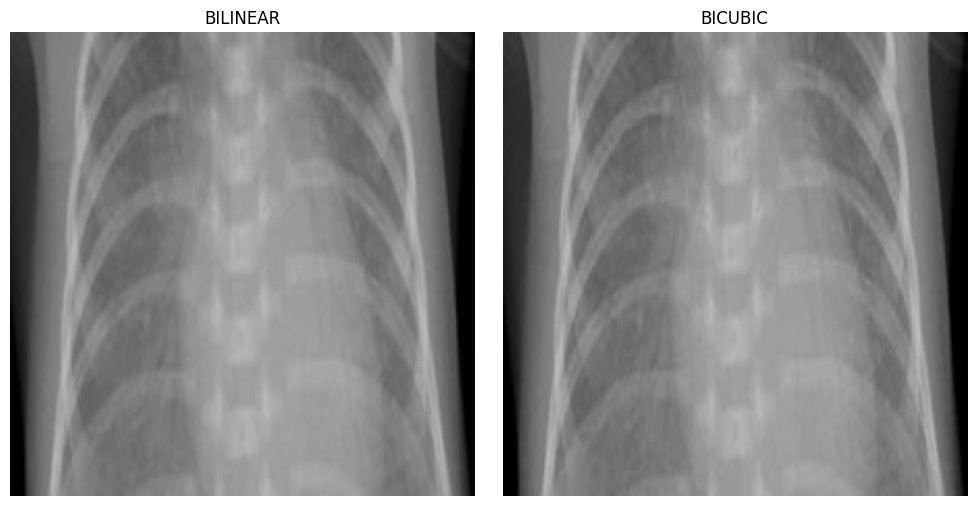

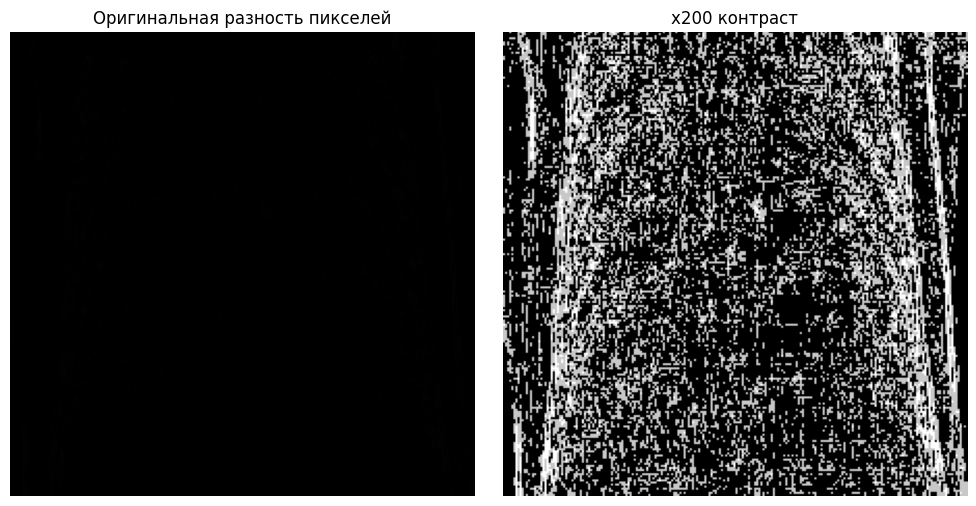

In [43]:
img_bilinear, img_bicubic = intpol_method_compare(img_small)
diff_small = img_diff(img_bilinear, img_bicubic)

Картина разности пикселей отличается, но и сами изображения тоже разные.

Проанализируем распределение пикселей для двух случаев, для этого сначала сформируем массивы пикселей:

In [44]:
diff_arr_big = np.array(diff_big.convert('L')).flatten()
diff_arr_small = np.array(diff_small.convert('L')).flatten()
len(diff_arr_big)

50176

Получились массивы длиной 50176 пикселей - это число определяется размерами изображения 224x224=50176.

Теперь исключим из массивов пиксели со значением 0 - это черный цвет, который говорит, что разницы между изображениями нет:

In [45]:
diff_arr_big = diff_arr_big[diff_arr_big != 0]
diff_arr_small = diff_arr_small[diff_arr_small != 0]
print('Процент разных пикселей:')
print(f"Большое изображение: {100 * len(diff_arr_big) / 50176:.1f}%")
print(f"Маленькое изображение: {100 * len(diff_arr_small) / 50176:.1f}%")

Процент разных пикселей:
Большое изображение: 45.0%
Маленькое изображение: 33.9%


Распределение яркости разности пикселей можно отобразить в виде гистограммы.  

Вертикальная шкала имеет логарифмический масштаб, чтобы лучше отобразить небольшие значения:

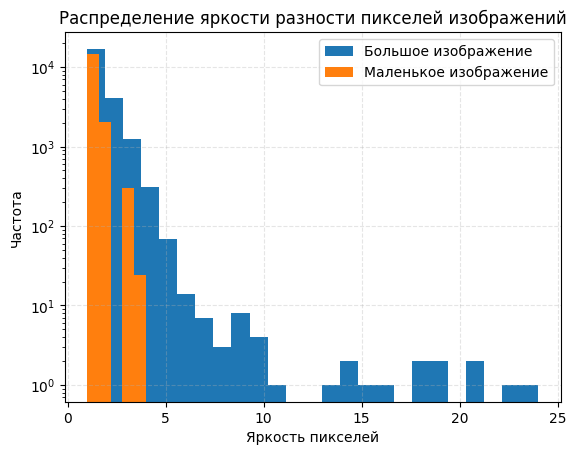

In [46]:
plt.hist(diff_arr_big, bins=25, label='Большое изображение')
plt.hist(diff_arr_small, bins=5, label='Маленькое изображение')
plt.title("Распределение яркости разности пикселей изображений")
plt.xlabel("Яркость пикселей")
plt.ylabel("Частота")
plt.yscale('log')
plt.legend()
plt.show()

Для двух рассмотренных файлов заметно разное влияние метода интерполяции при изменении размера. В обоих случаях разница для файлов рассматриваемого датасета весьма незначительна - проявляется лишь при очень сильном контрасте и не отображает какой-либо специфической информации.

Сделать однозначный вывод здесь трудно, потому что сами файлы имеют разное содержание, но можно предположить, что для ряда задач способ интерполяции может оказывать заметное влияние на этапе подготовки данных. Особенно, если файлы преобразуются в несколько подходов.

Однозначный вывод о влиянии интерполяции можно сделать проверив это на практике.

Я обучил пару моделей с применением бикубической интерполяции, чтобы оценить качество.

Подготовка данных с применением бикубической интерполяции отличается от стандартной, поэтому нужно отметить варианты реализации:
1. `ImageDataGenerator.flow_from_directory()` по умолчанию использует BILINEAR интерполяцию при изменении размера изображений и задать другой метод интерполяции (например, BICUBIC) через параметры невозможно, так как `flow_from_directory()` не предоставляет аргумента для выбора метода ресайза. Поэтому, можно **самостоятельно создать новый набор изображений** размером 224x224 используя нужный метод интерполяции.<br><br>Здесь следует иметь ввиду, что если изменить размер изображений из JPEG в JPEG, то эта операция определенно ухудшит качество (библиотека PIL имеет качество по умолчанию: 75%). Если на этапе подготовки данных применяется аугментация, то изображения также могут терять в качестве (даже при BICUBIC-интерполяции).<br><br>Поэтому, такой метод подойдет, если не применяется аугментация, либо необходимо предусмотреть сохранение изображений с высоким качеством (JPEG), либо в формате PNG.<br><br>Моя попытка обучить модель таким способом не дала приемлемого результата.
2. `image_dataset_from_directory` - **использование альтернативного метода подготовки изображений**. При таком методе придется модифицировать код:<br>
  2.1 **Загрузка данных** с `interpolation='bicubic'`

```
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

train_dataset = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    label_mode='binary',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    color_mode='rgb',
    interpolation='bicubic'
)

val_dataset = tf.keras.utils.image_dataset_from_directory(
    val_dir,
    label_mode='binary',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    color_mode='rgb',
    interpolation='bicubic'
)

test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    label_mode='binary',
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    color_mode='rgb',
    interpolation='bicubic'
)
```

ㅤㅤㅤ2.2 **Аугментация и нормализация** в виде отдельных слоев:

```
data_augmentation = tf.keras.Sequential([
    layers.Rescaling(1./255),
    layers.RandomRotation(0.03),              # ~10 градусов
    layers.RandomZoom(0.1),
    layers.RandomBrightness(0.1),
    layers.RandomTranslation(0.1, 0.1),
    layers.RandomFlip("horizontal")
])
```
ㅤㅤㅤ2.3 **Подготовка финальных датасетов**
```
AUTOTUNE = tf.data.AUTOTUNE

train_ds = (
    train_dataset
    .shuffle(1000)
    .map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)
    .prefetch(AUTOTUNE)
)

val_ds = val_dataset.map(lambda x, y: (x / 255.0, y)).prefetch(AUTOTUNE)
test_ds = test_dataset.map(lambda x, y: (x / 255.0, y)).prefetch(AUTOTUNE)
```
ㅤㅤㅤ2.4 **Подготовка модели**. Этот шаг остается без изменений.<br>
ㅤㅤㅤ2.5 **Обучение**:
```
model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=num_epochs
)
```

Я обучил модели используя `learning_rate=0.00005` и `0.0001` при количестве эпох равном 20:

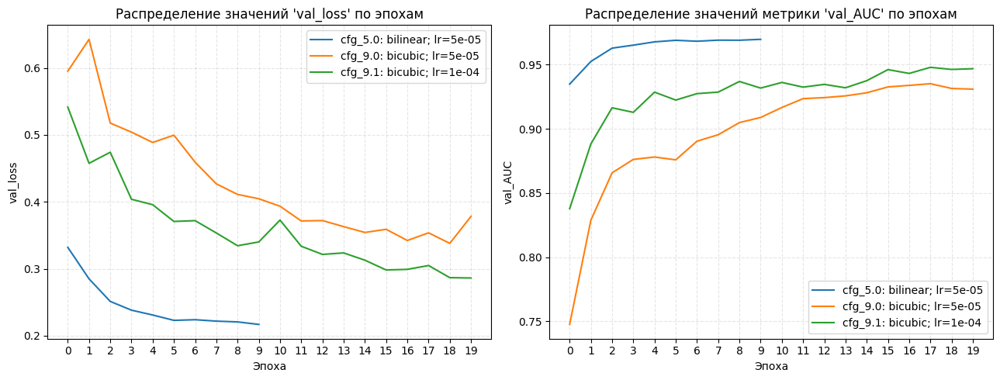

In [47]:
cfg_list = ['cfg_5.0',  'cfg_9.0', 'cfg_9.1']
models_compare(cfg_list,
               ['bilinear; lr=5e-05',  'bicubic; lr=5e-05', 'bicubic; lr=1e-04'],
               )

**Вывод**:
* Представляется, что метод интерполяции при изменении размера изображений для некоторых датасетов может оказывать заметное влияние, поэтому необходимо иметь это ввиду.
* На примере рассматриваемого датасета не удалось улучшить качество модели, применяя большее качественный метод интерполяции.
* Это согласуется с тем, что [разница изображений](#difference) преобразованных разными методами незначительна. Но может быть значима в другом наборе изображений.

[Вернуться к оглавлению](#index)

### 3.10 Анализ результата<a name="301"></a>
Граф исследуемых моделей (при наведении на узел отображаются основные параметры):

In [48]:
show_models_graph()

Метрики моделей на последней эпохе обучения:

In [49]:
metrics_compare(sorted(result.keys()))

,1.0,1.1,1.2,2.0,3.0,4.0,4.1,4.2,5.0,5.1,6.0,6.1,6.2,7.0,7.1,8.0,8.1,8.2,8.3,9.0,9.1
AUC,0.991,0.990,0.987,0.986,0.999,0.988,0.983,0.983,0.987,0.983,0.975,0.984,0.990,0.992,0.987,0.989,0.983,0.996,0.999,0.724,0.750
Precision,0.976,0.969,0.968,0.985,0.996,0.984,0.981,0.980,0.985,0.982,0.979,0.982,0.989,0.988,0.985,0.986,0.982,0.992,0.997,0.821,0.852
Recall,0.973,0.971,0.969,0.927,0.984,0.937,0.923,0.927,0.938,0.928,0.907,0.927,0.940,0.950,0.940,0.939,0.923,0.969,0.991,0.720,0.653
accuracy,0.962,0.956,0.953,0.935,0.985,0.942,0.930,0.932,0.943,0.933,0.916,0.933,0.947,0.954,0.945,0.945,0.931,0.971,0.991,0.675,0.658
loss,0.098,0.113,0.127,0.152,0.037,0.141,0.165,0.165,0.142,0.168,0.205,0.162,0.126,0.111,0.138,0.134,0.168,0.075,0.024,0.593,0.572
val_AUC,0.964,0.965,0.968,0.962,0.887,0.965,0.964,0.964,0.970,0.969,0.947,0.962,0.969,0.966,0.967,0.967,0.964,0.897,0.843,0.931,0.947
val_Precision,0.874,0.858,0.857,0.891,0.690,0.922,0.911,0.927,0.919,0.915,0.903,0.892,0.904,0.883,0.913,0.885,0.894,0.625,0.672,0.938,0.883
val_Recall,0.959,0.977,0.979,0.941,1.000,0.913,0.918,0.910,0.931,0.936,0.910,0.936,0.941,0.967,0.936,0.951,0.928,1.000,1.000,0.777,0.908
val_accuracy,0.888,0.885,0.885,0.891,0.720,0.897,0.893,0.899,0.905,0.905,0.883,0.889,0.901,0.899,0.904,0.893,0.886,0.625,0.696,0.829,0.867
val_loss,0.279,0.272,0.279,0.243,1.103,0.237,0.239,0.240,0.217,0.226,0.291,0.249,0.224,0.247,0.227,0.232,0.241,1.461,1.449,0.378,0.286


Метрики `val_AUC`, `val_Precision`, `val_Recall`, `val_accuracy` моделей на последней эпохе обучения в виде графика:

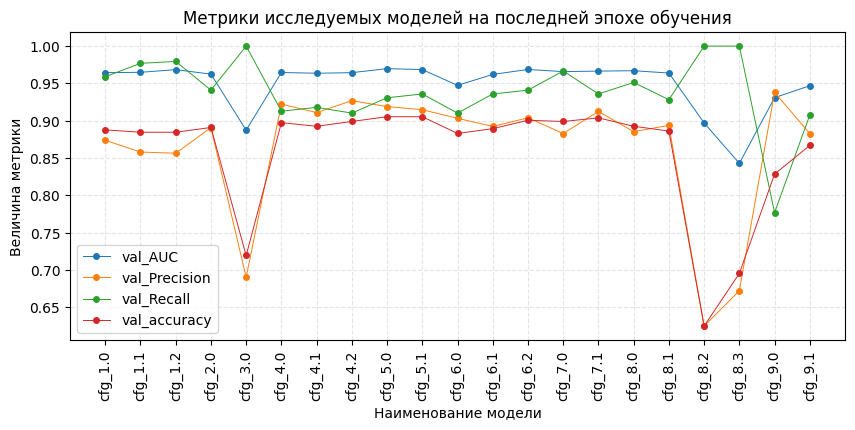

In [50]:
show_best_val_metric(result)

А также метрики модели с лучшим общим результатом:

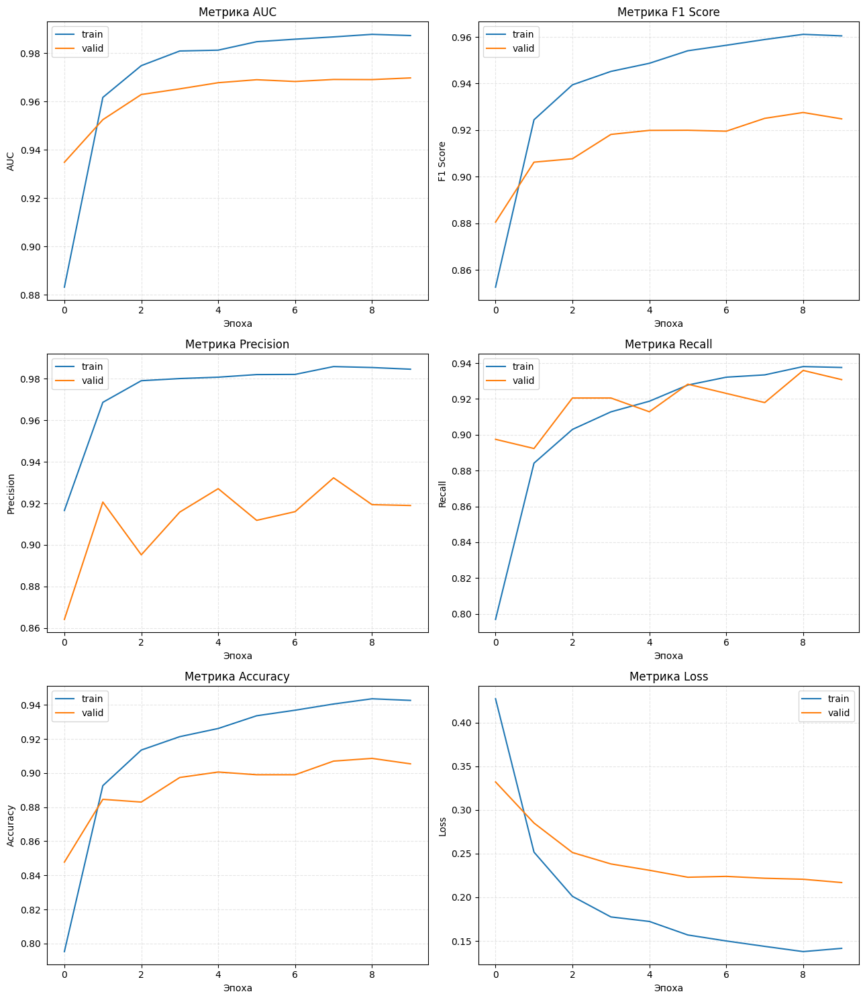

In [51]:
plot_training_history(result['cfg_5.0'])

Оценка модели на тестовых данных:

In [52]:
results = model_best.evaluate(test_generator)

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step - AUC: 0.9688 - Precision: 1.0000 - Recall: 0.7500 - accuracy: 0.8750 - loss: 0.2288


**Вывод**:
* Качество дообученной базовой модели MobileNetV2 вполне приемлемое для решения рассматриваемой задачи:
  * val_AUC 0.968
  * val_Precision 0.857
  * val_Recall 0.979
* В рамках обучения нескольких вариантов моделей с различными параметрами не удалось существенно изменить качество базовой модели.
* Однако, в общем понимании установлено какие параметры могут улучшать или наоборот ухудшать качество:
  * Для рассматриваемых данных - датасет и модель - `class_weight` и `learning_rate` являются предметом тонкой настройки. Слишком большое или слишком маленькое значение этих параметров может приводить к ухудшению качества.
  * Разморозка "скелета" однозначно привела к ухудшению качества. При разных значениях других параметров не удалось приблизиться к приемлемому качеству.
  * Увеличение количества нейронов в `Dense()`-слое улучшило характеристики модели.
  * А вот добавление еще одного `Dense()`-слоя (с разным количеством нейронов) наоборот - усложнило модель и снизило качество.
  * Для рассматриваемого датасета - лучший результат получен с применением опции горизонтального поворота. Вертикальный поворот или "горизонтальный+вертикальный" не повлияли на результат.
  * Не выявлено четкого влияния метода интерполяции при масштабировании изображений на этапе подготовки на качество модели.

[Вернуться к оглавлению](#index)

## 4. Построение тепловой карты активации класса<a name="400"></a>
**Тепловая карта активации класса** — это двумерная сетка оценок, связанных с конкретным выходным классом и вычисляемых для каждого местоположения в любом входном изображении. Эти оценки определяют, насколько важно каждое местоположение для рассматриваемого класса.

Тепловая карта активации класса позволяет понять, какие части анализируемого изображения помогли сверточной нейронной сети принять окончательное решение о его классификации.

Для построения тепловых карт активации класса я использую реализацию **Grad-CAM**. Суть этого метода в отображении карты признаков для входного изображения, полученную на выходе сверточного слоя, и взвешивании каждого канала в ней по градиенту класса для данного канала. Проще говоря, этот трюк заключается во взвешивании признаков в пространственной карте «как интенсивно входное изображение активирует разные каналы» по признаку «насколько важен каждый канал для данного класса». В результате получается пространственная карта признаков «как интенсивно входное изображение активирует класс».

Тепловая карта Grad-CAM показывает участки изображения, которые модель сочла наиболее важными для текущего предсказания.

То есть:
* Если модель предсказывает **класс 1 (пневмония)** → Grad-CAM покажет, где именно на изображении она увидела <ins>пневмонию</ins>.
* Если модель предсказывает **класс 0 (норма)** → Grad-CAM покажет, на какие области она опиралась , чтобы решить, что это <ins>не пневмония</ins>.

⚠️ Grad-CAM не фокусируется на "пневмонии" автоматически. Он фокусируется на тех участках, которые модель использовала для формирования своего предсказания — независимо от того, какой это был класс.

> Для подготовки изображения и построения тепловой карты я использую код которой основан на информации из книги <abbr title="Шолле Ф. Глубокое обучение на Python. 2-е межд. изд. — СПб.: Питер, 2023. — 576 с.: ил.">"Глубокое обучение на Python"</abbr>.

Для построения тепловой карты необходимы данные полученные на выходе сверточного слоя. Рассмотрим подробней структуру исследуемой модели.

Для начала отобразим информацию об устройстве сети:

In [53]:
model_base.summary()

Model: "model_base"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       163,968 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,750,277 (10.49 MB)

 Trainable params: 164,097 (641.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

 Optimizer params: 328,196 (1.25 MB)

Модель состоит из
* **Скелет**: `mobilenetv2_1.00_224` - включает слои предобученной MobileNetV2 без "головы"
* **Голова** для задачи бинарной классификации:
  * `GlobalAveragePooling2D`
  * `Dense(128)`
  * `Dropout`
  * `Dense(1)`

Как можно заметить, в "голове" нет тензорных слоев, которые как раз и нужны для построения тепловой карты. Последний слой с размерностью (7, 7) находится в скелете `mobilenetv2_1.00_224`.

Отобразим последние 5 слоев скелета `mobilenetv2_1.00_224`:

In [54]:
n = 5
layers_lst = model_base.get_layer('mobilenetv2_1.00_224').layers
for i, val in enumerate(layers_lst[-n:], start=len(layers_lst) - n + 1):
    print(i, '\33[103m' + repr(val) + end, f"output_shape={val.output.shape}")

150 <Conv2D name=block_16_project, built=True> output_shape=(None, 7, 7, 320)
151 <BatchNormalization name=block_16_project_BN, built=True> output_shape=(None, 7, 7, 320)
152 <Conv2D name=Conv_1, built=True> output_shape=(None, 7, 7, 1280)
153 <BatchNormalization name=Conv_1_bn, built=True> output_shape=(None, 7, 7, 1280)
154 <ReLU name=out_relu, built=True> output_shape=(None, 7, 7, 1280)


Скелет модели  `mobilenetv2_1.00_224` содержит 154 слоя. Последний сверточный слой имеет название `out_relu`.  
<u>Это следует зафиксировать.</u>

Процесс создания тепловой карты состоит из нескольких этапов.
1. Загрузка изображения и преобразование в тензор:

In [55]:
img_path = '/content/chest_xray/val/NORMAL/NORMAL2-IM-1427-0001.jpeg'

# Загрузка изображения и преобразование в массив
original_img = tf.keras.preprocessing.image.load_img(img_path, target_size=(224,224))
img_array = tf.keras.utils.img_to_array(original_img)
img_array /= 255.0  # Нормализация
img_array = np.expand_dims(img_array, axis=0)  # Добавляем batch dimension

# Преобразование входного изображения в тензор
img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)

2. Создание промежуточных моделей для извлечения градиентов:

In [56]:
# Определение последнего сверточного слоя MobileNetV2
last_conv_layer_name = "out_relu"  # Слой активации для MobileNetV2

# Извлечение названий классификаторных слоёв
classifier_layer_names = [
    layer.name for layer in model_base.layers
    if isinstance(layer, (tf.keras.layers.GlobalAveragePooling2D, tf.keras.layers.Dense))
]  # Ожидаемые слои: ["global_average_pooling2d", "dense", "dense_1"]

# Получение базовой модели (MobileNetV2)
backbone = model_base.get_layer('mobilenetv2_1.00_224')

# Создание модели для последнего свёрточного слоя
inputs = model_base.inputs
backbone_output = backbone(inputs[0])  # Выход базовой модели
last_conv_output = backbone.get_layer(last_conv_layer_name)(backbone_output)  # Выход последнего свёрточного слоя
last_conv_layer_model = tf.keras.Model(inputs=inputs, outputs=last_conv_output)  # Модель для получения выхода свёрточного слоя

# Создание модели классификатора
classifier_input = tf.keras.Input(shape=last_conv_output.shape[1:])  # Входной тензор для классификатора
x = classifier_input
for layer_name in classifier_layer_names:
    layer = model_base.get_layer(layer_name)
    x = layer(x)  # Пропуск через классификаторные слои
classifier_model = tf.keras.Model(classifier_input, x)  # Модель для вычисления классификации

3. Получение градиентов и построение тепловой карты:

In [57]:
# Получение градиентов с помощью GradientTape
with tf.GradientTape() as tape:
    tape.watch(img_tensor)  # Наблюдаем за входным тензором
    last_conv_layer_output = last_conv_layer_model(img_tensor)  # Выход последнего свёрточного слоя
    tape.watch(last_conv_layer_output)  # Наблюдаем за выходом свёрточного слоя
    preds = classifier_model(last_conv_layer_output)  # Предсказание классификатора
    top_pred_index = 0  # Индекс класса "пневмония"
    top_class_channel = preds[:, top_pred_index]  # Выбор канала для пневмонии

grads = tape.gradient(top_class_channel, last_conv_layer_output)  # Градиенты по отношению к выходу свёрточного слоя
if grads is None:
    raise ValueError("Gradients are None, check model and layer configuration.")

pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy()  # Усреднение градиентов
last_conv_layer_output = last_conv_layer_output.numpy()[0]  # Преобразование в NumPy-массив

# Взвешивание карты признаков на основе градиентов
for i in range(pooled_grads.shape[-1]):
    last_conv_layer_output[:, :, i] *= pooled_grads[i]

heatmap = np.mean(last_conv_layer_output, axis=-1)  # Среднее значение по каналам
heatmap = np.maximum(heatmap, 0)  # Отрицательные значения удаляются
heatmap /= np.max(heatmap + 1e-10)  # Нормализация

На данном этапе мы получили тепловую карту размером 7x7. Чтобы улучшить читабельность тепловой карты можно увеличить ее размер, используя один из вариантов интерполяции (например `bilinear` или `bicubic`).

4. Увеличение разрешения тепловой карты:

In [58]:
# Увеличение разрешения тепловой карты
heatmap_tensor = tf.expand_dims(tf.expand_dims(heatmap, axis=-1), axis=0)

# bilinear
heatmap_resized_bilinear = tf.image.resize(heatmap_tensor, (224, 224), method='bilinear')
heatmap_resized_bilinear = tf.squeeze(heatmap_resized_bilinear).numpy()

# bicubic
heatmap_resized_bicubic = tf.image.resize(heatmap_tensor, (224, 224), method='bicubic')
heatmap_resized_bicubic = tf.squeeze(heatmap_resized_bicubic).numpy()

Данные для тепловой карты и ее увеличенной версии рассчитаны, можно выводить на экран.

5. Визуализация:<a name="heatmap"></a>

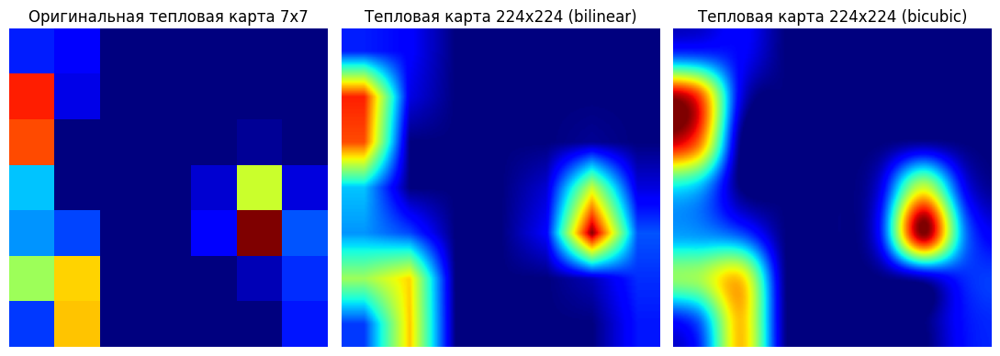

In [59]:
fig, axes = plt.subplots(1, 3, figsize=(11, 5))

# Оригинальное изображение 7x7
axes[0].imshow(plt.cm.jet(heatmap))
axes[0].set_title("Оригинальная тепловая карта 7x7")
axes[0].axis('off')

# Тепловая карта 224x224 bilinear
axes[1].imshow(plt.cm.jet(heatmap_resized_bilinear))
axes[1].set_title("Тепловая карта 224x224 (bilinear)")
axes[1].axis('off')

# Тепловая карта 224x224 bicubic
axes[2].imshow(plt.cm.jet(heatmap_resized_bicubic))
axes[2].set_title("Тепловая карта 224x224 (bicubic)")
axes[2].axis('off')

plt.tight_layout()
plt.show()

При построении тепловой карты активации класса необходимо иметь в виду изначальную размерность выходного слоя.

В данном случае выходной слой `out_relu` имеет размер 7x7 пикселей - это видно по рисунку выше - все изображение состоит из сетки квадратов 7x7.

Поэтому и выделение активных областей может оказаться недостаточно точным - погрешность 1/7 изображения или около 14%.

При выборе модели для решения задачи компьютерного зрения, если планируется визуализация слоев активации, то необходимо убедиться, что размера выходного слоя достаточно.

Как меру улучшения можно интерполировать тепловую карту - это позволит получить более плавную карту активации.

Метод интерполяции может быть разным. В примере выше я представил два изображения с разными типами интерполяции - `bilinear` и `bicubic`:
* **bilinear**:
  * Метод учитывает 4 ближайших пикселя (2×2) и делает линейную интерполяцию по осям X и Y.
  * <ins>Плюсы</ins>: быстрый, простой, сглаживает изображение; <ins>минусы</ins>: теряет резкость, плохо сохраняет детали.

* **bicubic**:
  * Метод использует 16 пикселей (4×4) и применяет кубическую интерполяцию, что дает более плавные переходы.
  * <ins>Плюсы</ins>: лучше сохраняет детали и текстуры; <ins>минусы</ins> медленнее, может немного размывать или вызывать артефакты на границах.

Есть и другие методы интерполяции, подробнее можно узнать в документации: [tf.image.resize](https://www.tensorflow.org/api_docs/python/tf/image/resize)

Используя вспомогательную функцию `image_check`, в основе которой лежит вышеприведенный код, отобразим тепловые карты активации, полученные на основе базовой и лучшей модели, для произвольного изображения из класса NORMAL:

model_base
Прогнозируемая вероятность пневмонии: 24.38%


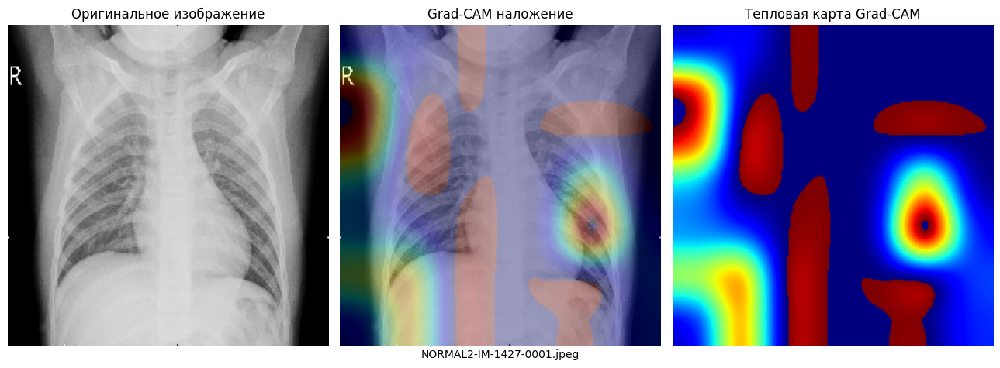


model_best
Прогнозируемая вероятность пневмонии: 18.15%


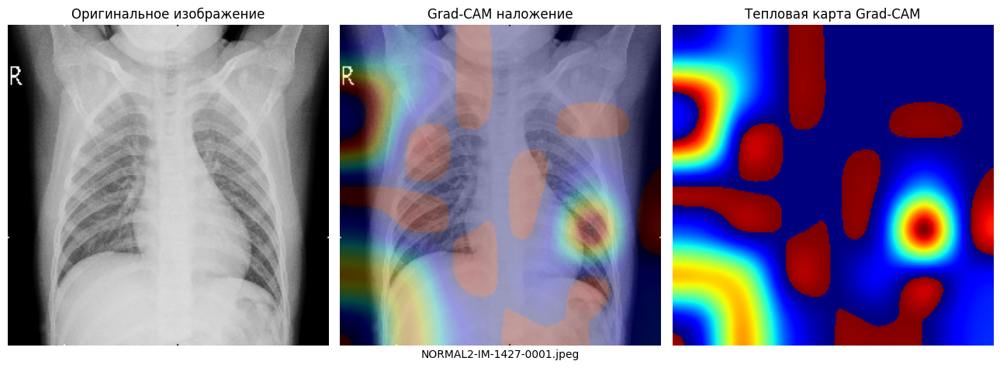

In [60]:
random.seed(1)
image_path = os.path.join(test_dir, 'NORMAL')
image = os.path.join(image_path, random.sample(os.listdir(image_path), 1)[0])

for model in [model_base, model_best]:
    print(bold + model.name + end)
    image_check(image, model)
    print()

Рассмотрим еще одно изображение класса NORMAL:

model_base
Прогнозируемая вероятность пневмонии: 17.94%


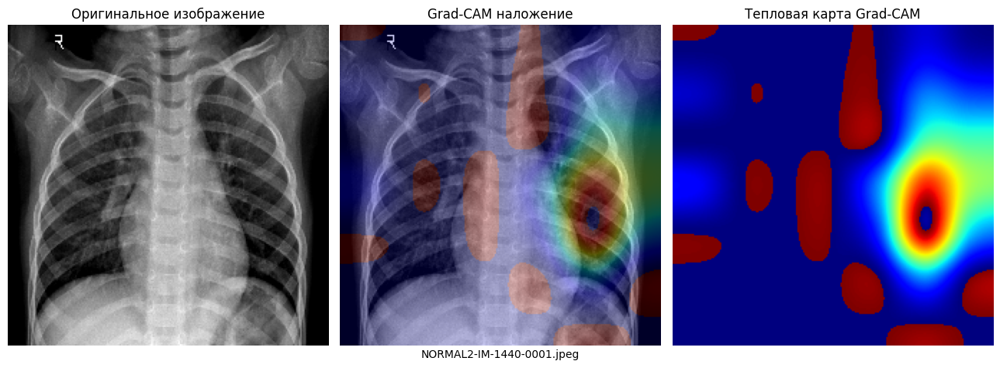


model_best
Прогнозируемая вероятность пневмонии: 15.03%


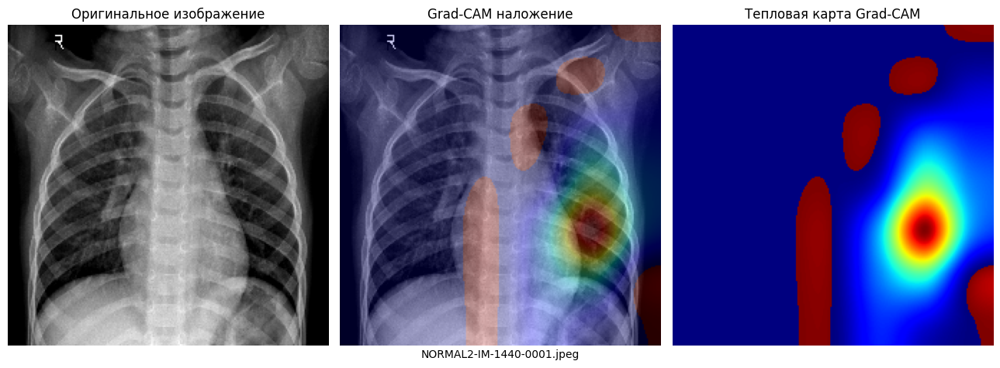

In [61]:
random.seed(5)
image_path = os.path.join(test_dir, 'NORMAL')
image = os.path.join(image_path, random.sample(os.listdir(image_path), 1)[0])

for model in [model_base, model_best]:
    print(bold + model.name + end)
    image_check(image, model)
    print()

Теперь рассмотрим изображение класса PNEUMONIA:

model_base
Прогнозируемая вероятность пневмонии: 98.50%


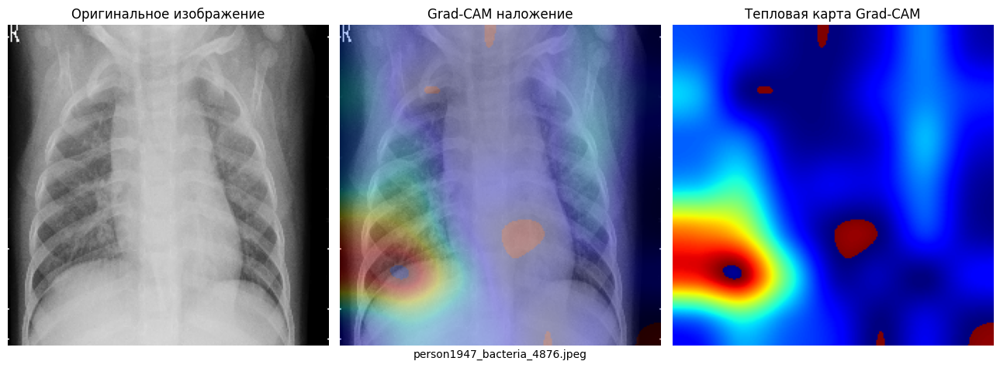


model_best
Прогнозируемая вероятность пневмонии: 90.91%


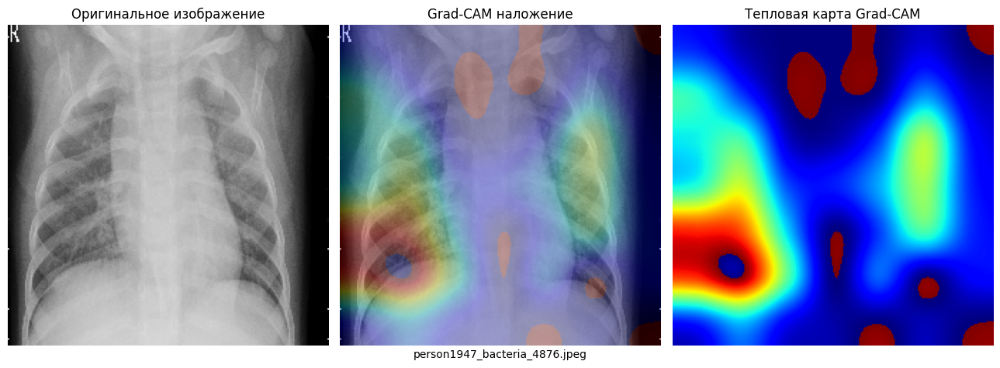

In [62]:
random.seed(1)
image_path = os.path.join(test_dir, 'PNEUMONIA')
image = os.path.join(image_path, random.sample(os.listdir(image_path), 1)[0])

for model in [model_base, model_best]:
    print(bold + model.name + end)
    image_check(image, model)
    print()

Еще одно изображение класса PNEUMONIA:

model_base
Прогнозируемая вероятность пневмонии: 99.93%


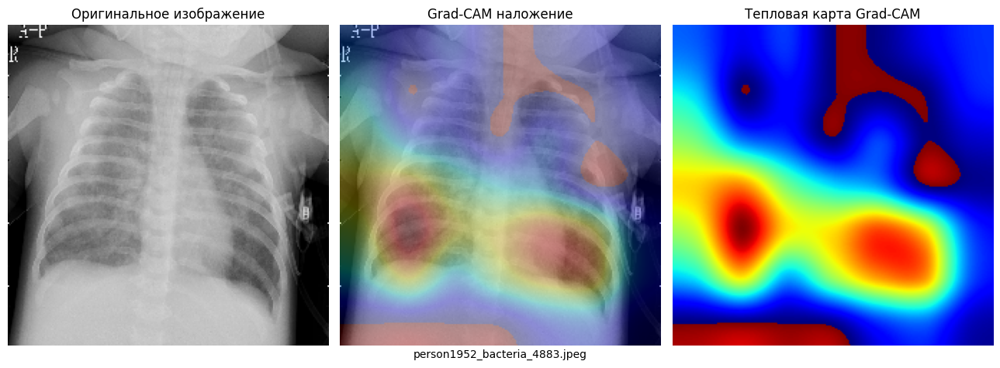


model_best
Прогнозируемая вероятность пневмонии: 98.99%


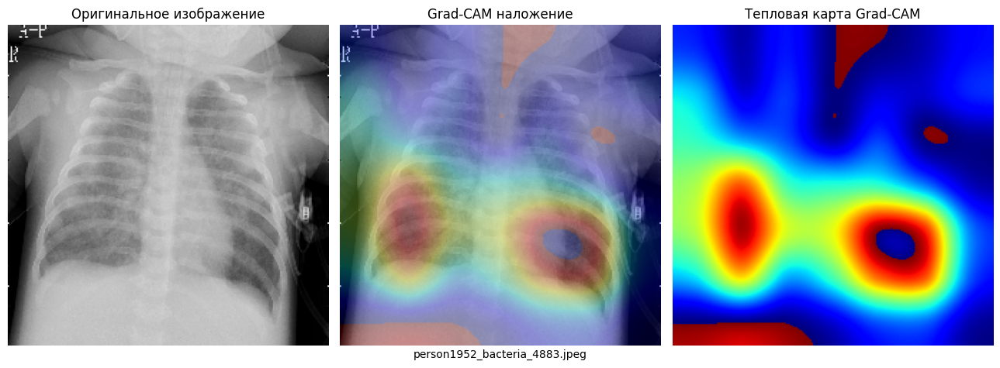

In [63]:
random.seed(2)
image_path = os.path.join(test_dir, 'PNEUMONIA')
image = os.path.join(image_path, random.sample(os.listdir(image_path), 1)[0])

for model in [model_base, model_best]:
    print(bold + model.name + end)
    image_check(image, model)
    print()

**Вывод**:
* Можно отметить адекватное отображение карт активации - модель во всех проверенных случаях классифицирует изображение, принимая во внимание части изображений находящейся в области легких.
* Неточности отображения можно объяснить низким разрешением выходного слоя: 7x7, при разрешении изображения 224x224.
* Если одной из задач обучения модели является анализ тепловых карт слоя активации, то необходимо предусмотреть, чтобы выходной слой имел достаточное разрешение.

## Общий вывод<a name="500"></a>
Для данных представленных в виде датасета **Chest X-Ray Images** содержащих рентгенограммы грудной клетки поделенные на два класса Pneumonia / Normal проведено исследование.

Основные этапы и результаты:
1. **Анализ данных**.
* Задача классификации изображений решается для набора данных с дисбалансом целевого признака:

target|train|val|test
-|-|-|-
PNEUMONIA|74.3|50|62.5
NORMAL|25.7|50|37.5

* В свою очередь  класс PNEUMONIA имеет разделение на подклассы bacteria/virus тоже с дисбалансом:

target|train|val|test
-|-|-|-
bacteria|65.3|100|62.1
virus|34.7|0|37.9

* Изображения представлены в виде файлов со средними параметрами:
  * ширина ~1280 пикселей
  * высота ~890 пикселей
  * разрешение ~1.1 Мпикселей

* Разрешение файлов варьируется от ~0.05 Мп до ~7.5 Мп

* Изображения относящиеся к разным классам и разным подклассам имеют визуальные отличия. Но, в рамках всего набора данных, эти отличия количественно выражены довольно слабо - графики усредненной яркости пикселей изображений имеют лишь небольшие расхождения для классов целевого признака.

* Это позволяет предположить, что решающим фактором в данной задаче являются не глобальные статистики изображения (например, распределение яркости), а пространственные особенности и локальная структура изображения. Что делает актуальным применение моделей компьютерного зрения.

2. **Исследование моделей**.
* В качестве модели рассматривалась сверточная сеть на базе MobileNetV2.
Выбор в пользу данной модели обусловлен ее компактностью - обученная модель имеет размер около 10 МБайт. Умеренной сложностью и приемлемым качеством для классификации изображений. Модель хорошо себя зарекомендовала при решении множества задач компьютерного зрения и в рамках данного проекта я проверил как она справится с поставленной задачей.<br><br>Дообученная на изображениях датасета модель показала довольно хорошие метрики качества:
  * val_AUC 0.968
  * val_Precision 0.857
  * val_Recall 0.979

* Варьируя разные параметры как самой модели, так и алгоритма подготовки данных я попытался выявить факторы, оказывающие влияние на качество предсказания.

  * **Баланс классов**. Поскольку данные в датасете представлены разным количеством изображений для классов целевого признака я попробовать обучить модель используя балансировку. Обучение модели с балансом классов уменьшило значение функция потерь на валидации. В то же время, метрики AUC и Recall немного снизились, а Precision - увеличилась. Такой результат говорит о том, что можно продолжить исследование оптимальных коэффициентов баланса классов и найти такие значения, которые обеспечат максимальное качество модели. Поиск коэффициентов - задача тонкой настройки модели.
  * **Разморозка слоев**. В базовом варианте использовались замороженные слои модели MobileNetV2 `backbone.trainable = False`. Обычно слои базовой модели замораживаются, когда модель обучается на недостаточно большом объеме данных - если не заморозить, то модель скорее всего переобучится - будут высокие метрики на обучении и низкие на валидации. Я попробовал обучить модель разморозив слои, но качество такой модели оказалось заметно хуже.
  * **Аугментация: поворот изображений**. Датасет представлен рентгенограммами выполненными согласно единому стандарту - 'anterior-posterior images' - обозначают рентгеновскую проекцию, при которой излучение направлено от передней части тела (anterior) к задней (posterior). Изначально я не применял поворот изображений на этапе подготовки данных, поскольку было не очевидно как модель на это отреагирует. При обучении модели с разными вариантами поворота было выявлено, что максимальное качество обеспечила опция горизонтального поворота, вертикальный или горизонтальный+вертикальный поворот не оказали заметного влияния.
  * **Оптимальная скорость обучения модели**. В базовом варианте модель обучалась с помощью оптимизатора Adam со скоростью 0.001. При таком значении была заметна нестабильность метрик по эпохам и отрыв метрик на валидации от метрик на обучении. Я пробовал обучать модели используя разные значения скорости обучения - как постоянные, так и динамические (с помощью методов LearningRateScheduler и CosineDecay). Самым оптимальным значением для рассматриваемых условий оказалось постоянная скорость равная 0.00005. Большие или меньшие значения показывали худший результат, использование динамической скорости обучения тоже не дало выигрыша в качестве модели. Тем не менее, были рассмотрены лишь частные варианты и поиск более оптимального значения можно продолжить. Поиск оптимального значения learning_rate - задача тонкой настройки.
  * **Размерность слоя Dense()**. В базовой модели использовался слой Dense() со 128 нейронами. Это количество было выбрано как компромисс между мощностью и простотой модели. Я попробовал обучить модель с 256 и 64 нейронами в данном слое. Модель с 256 нейронами показала лучшее качество.
  * **Количество слоев Dense()**. Помимо размерности слоя Dense() я пробовал менять структуру модели использую не один, а два слоя. Сравнивал такие варианты:
    * Один слой Dense(256)
    * Два слоя Dense(256)+Dense(128)
    * Два слоя Dense(128)+Dense(64)
    
    Усложнение модели путем добавления еще одного Dense() слоя не дало прироста качества, оптимальным вариантом остался один слой Dense(256).
  * **Количество эпох обучения**. В базовом варианте я использовал для обучения 10 эпох. Я пробовал увеличивать количество эпох для варианта, который уже показал хороший результат, а также для варианта модели с размороженным backbone - при 10 эпохах казалось, что ему не хватает времени для обучения. Но все эти варианты не дали прироста качества - для первого случая - обучение прекращалось на тех же 10 эпохах по сигналу EarlyStopping. А для варианта с размороженным backbone и 20 эпох не хватило, чтобы догнать лучший результат.
  * **Метод интерполяции изображений**. ImageDataGenerator при подготовке изображений масштабирует их до нужного размера используя метод интерполяции по умолчанию `bilinear`. На этапе построения тепловой карты активации класса я обратил внимание на то как от выбранного метода интерполяции зависит вид масштабированного изображения. Поскольку в данном исследовании рассматривается датасет с рентгенограммы, я подумал, что артефакты изображений вносимые при масштабировании могут оказывать влияние на качество модели, и что метод интерполяции также влияет на это. Я попробовал обучить модель с бикубической интерполяцией изображений, но лучшего результат не получил. Следует отметить, что помимо разного метода интерполяции, пайплайны подготовки изображений также отличаются, поэтому для более однозначного вывода требуется больше исследований. Я ограничился лишь парой вариаций, поскольку качество моделей оказалось хуже чем при билинейной интерполяции.<br><br>В целом, можно отметить хорошее качество модели для решения рассматриваемой задачи, учитывая ее простоту и компактность. У модели есть пути оптимизации качества.

3. **Визуализация тепловых карт активации класса**. Одной из задач проекта было освоение метода визуализации тепловых карт активации класса модели на примере Grad-CAM. В рамках данной задачи рассмотрены основные этапы процесса:
* Загрузка изображения и преобразование в тензор.
* Создание промежуточных моделей для извлечения градиентов.
* Получение градиентов и построение тепловой карты.
* Увеличение разрешения тепловой карты.
* Визуализация.

Как правило выходной слой модели имеет более низкое разрешение, чем само входное изображение - в данном случае выходной слой имеет разрешение 7x7, а изображение - 224x224. Как вариант улучшения тепловой карты является интерполяция до нужного размера. Я привел пример как метод интерполяции влияет на качество итоговой картинки.

Следует отметить, что если одной из целей классификации изображения является визуальный анализ тепловой карты слоя активации, то необходимо предусмотреть, чтобы выходной слой имел достаточное разрешение, для этого подобрать оптимальную модель.

В рамках данного исследования основные цели и задачи выполнены. Полученные результаты могут быть использованы для решения подобных задач компьютерного зрения.

Путем дальнейшего исследования задач компьютерного зрения является изучение более сложных моделей и более комплексных вопросов.